# Obligatorio - Taller de Deep Learning

**Fecha de entrega:** 3/12/2025  
**Puntaje máximo:** 50 puntos

**Alumno(s):** Natialia Campiglia - Maria Jose Carbajal

## Obligatorio

El objetivo de este obligatorio es evaluar su conocimiento en Deep Learning mediante la implementación completa de un modelo de segmentación de imágenes basado en el paper [**"U-Net: Convolutional Networks for Biomedical Image Segmentation"**](https://arxiv.org/pdf/1505.04597). Toda la implementación debe realizarse desde cero utilizando PyTorch, y los estudiantes tendrán la libertad de ajustar ciertos hiperparámetros y configuraciones mientras mantengan la esencia del paper original.

### **Competencia en Kaggle**

Además, como parte de este obligatorio, participarán en una competencia privada en Kaggle donde se les proporcionará un dataset de test oculto (sin target). Deberán subir sus predicciones a Kaggle y se evaluarán en función de la métrica **Dice Coefficient (Coeficiente de Dice)**. Esta competencia les permitirá comparar sus resultados con los de sus compañeros en un entorno real de evaluación.

### **¿Qué es el Dice Coefficient?**
El **Dice Coefficient**, también conocido como F1-score para segmentación, es una métrica utilizada para evaluar la similitud entre la predicción y la verdad del terreno en tareas de segmentación. Se define de la siguiente manera:

$$
\text{Dice} = \frac{2 \cdot |A \cap B|}{|A| + |B|}
$$

Donde:
- $A$ es el conjunto de píxeles predichos como pertenecientes a la clase positiva.
- $B$ es el conjunto de píxeles verdaderos pertenecientes a la clase positiva.
- $|A \cap B|$ es la intersección de $A$ y $B$, es decir, los píxeles correctamente predichos como positivos.

Un valor de Dice de **1** indica una predicción perfecta, mientras que un valor de **0** indica que no hay coincidencia entre la predicción y el valor verdadero. Durante la competencia de Kaggle, deberán obtener un puntaje de al menos **0.75** en la métrica Dice para considerarse aprobados.

### **Criterios a Evaluar**

1. **Análisis del Dataset (5 puntos):**
   - Exploración y visualización del dataset para comprender su estructura y características.
   - Justificación de las decisiones tomadas en la preprocesamiento de datos, como normalización, aumento de datos (data augmentation), y partición del dataset en conjuntos de entrenamiento, validación y prueba.

2. **Implementación Correcta del Modelo U-Net (20 puntos):**
   - Construcción de la arquitectura U-Net siguiendo la estructura descrita en el paper, permitiendo ajustes como el número de filtros, funciones de activación y métodos de inicialización de pesos.
   - Se aceptan mejoras como el uso de técnicas adicionales como batch normalization, otras funciones de activación, etc.

3. **Entrenamiento del Modelo (10 puntos):**
   - Configuración adecuada del ciclo de entrenamiento, incluyendo la elección de la función de pérdida y del optimizador (Adam, SGD, etc.).
   - Uso de técnicas de regularización para mejorar la generalización del modelo, como el dropout, normalización de batch y data augmentation.
   - Gráficas y análisis de la evolución del entrenamiento, mostrando las curvas de pérdida y métricas relevantes tanto en el conjunto de entrenamiento como en el de validación.
   - Puede utilizarse experimentación con hiperparámetros con Weights & Biases (W&B) para optimizar el rendimiento del modelo. Este punto no es obligatorio, pero se valorará positivamente si se justifica su uso y se presentan resultados claros.

4. **Evaluación de Resultados (10 puntos):**
   - Evaluación exhaustiva del modelo utilizando métricas de segmentación como **Dice Coefficient**.
   - Análisis detallado de los resultados, incluyendo un análisis de errores para identificar y discutir casos difíciles.
   - Visualización de ejemplos representativos de segmentaciones correctas e incorrectas, comparando con las etiquetas manuales proporcionadas en el dataset.

5. **Participación y Resultados en la Competencia Kaggle (5 puntos):**
   - Participación activa en la competencia de Kaggle, con al menos una (1) subida de predicción.
   - Puntaje obtenido en la tabla de posiciones de Kaggle, evaluado en base al **Dice Coefficient** en el conjunto de test oculto. Es necesario obtener al menos un valor de **0.75** para esta métrica.

   Notas:
   - **Cualquier decisión debe ser justificada en el notebook.**
   - El **Dice Coefficient** es la métrica utilizada para evaluar la precisión de los modelos de segmentación de imágenes en esta competencia.

### **Run-Length Encoding (RLE)**

Dado que no se suben las imágenes segmentadas directamente a Kaggle, se requiere usar **Run-Length Encoding (RLE)** para comprimir las máscaras de predicción en una cadena de texto que será evaluada. El **RLE** es una técnica de compresión donde se representan secuencias consecutivas de píxeles en formato `start length`, indicando la posición de inicio y la longitud de cada secuencia de píxeles positivos.

Para calcular el **RLE**, se sigue el siguiente proceso:

1. Se aplanan las máscaras predichas en un solo vector
2. Se identifican los píxeles con valor positivo (1) y se calculan las secuencias consecutivas.
3. Se registra la posición de inicio de cada secuencia y su longitud en formato `start length`.

Este formato comprimido se sube a Kaggle en lugar de las imágenes segmentadas.

#### **Ejemplo de RLE**

```python
import numpy as np

def rle_encode(mask):
    pixels = np.array(mask).flatten(order='F')  # Aplanar la máscara en orden Fortran
    pixels = np.concatenate([[0], pixels, [0]])  # Añadir ceros al principio y final
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1  # Encontrar transiciones
    runs[1::2] = runs[1::2] - runs[::2]  # Calcular longitudes
    return ' '.join(str(x) for x in runs)

mask = np.array([[0, 0, 1, 0, 0],
                 [0, 1, 1, 1, 0],
                 [1, 1, 1, 0, 0],
                 [0, 0, 0, 1, 1]])

print(rle_encode(mask))
```

> **Salida:** 3 1 6 2 9 3 14 1 16 1 20 1


### **Sobre el Dataset**

El dataset proporcionado para esta tarea incluirá imágenes y máscaras para la segmentación de un conjunto específico de clases. El conjunto de entrenamiento estará disponible para su uso durante todo el proceso de desarrollo y pruebas, mientras que el conjunto de validación se mantendrá oculto para la evaluación final en Kaggle.

### **Instrucciones de Entrega**

- Deberán entregar un Jupyter Notebook (.ipynb) que contenga todo el código y las explicaciones necesarias para ejecutar la implementación, el entrenamiento y la evaluación del modelo.
- El notebook debe incluir secciones bien documentadas explicando las decisiones de diseño del modelo, los experimentos realizados, y los resultados obtenidos.
- El código debe estar escrito de manera clara.
- La entrega debe realizarse a través de la plataforma de gestión de ORT (gestion.ort.edu.uy) antes de la fecha límite.

### **Materiales Adicionales**

Para facilitar su trabajo, pueden consultar los siguientes recursos:

- [U-Net: Convolutional Networks for Biomedical Image Segmentation (paper original)](https://arxiv.org/abs/1505.04597)
- [Documentación de PyTorch](https://pytorch.org/docs/stable/index.html)
- [Tutoriales y recursos adicionales en Kaggle](https://www.kaggle.com/)
- [Convolución Transpuesta](https://d2l.ai/chapter_computer-vision/transposed-conv.html)

### **Competencia Kaggle**

[Link a la competencia Kaggle](https://www.kaggle.com/competitions/tdl-obligatorio-2025)

---

# Integrantes del grupo

Natalia Campiglia - 349251

Maria Jose Carbajal - 241319

# Imports e inicializaciones

In [1]:
!pip install kaggle
!pip install torchinfo

In [2]:
import os, json, random
import hashlib

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import math

from collections import Counter
from PIL import Image
from pathlib import Path

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import torch
import torch.nn as nn
from torchinfo import summary
from torchvision import transforms
import torchvision.transforms.v2 as T
from torch.utils.data import random_split, DataLoader, Dataset, Subset
import torch.optim as optim
import torch.nn.functional as F

from utils import (
    train,
    evaluate,
    model_classification_report,
    plot_training,
    match_output_dim,
    plot_confusion_matrix,
    print_metrics_report,
    predict_and_build_submission,
    match_output_to_dim
)

### Reload imports sin necesidad de restart la notebook

In [3]:
import importlib
import sys
if 'utils' in sys.modules:
    importlib.reload(sys.modules['utils'])

In [4]:
# Fijamos la semilla para que los resultados sean reproducibles
SEED = 23

torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


In [5]:
import sys

# definimos el dispositivo que vamos a usar
DEVICE = "cpu"  # por defecto, usamos la CPU
if torch.cuda.is_available():
    DEVICE = "cuda"  # si hay GPU, usamos la GPU
elif torch.backends.mps.is_available():
    DEVICE = "mps"  # si no hay GPU, pero hay MPS, usamos MPS
elif torch.xpu.is_available():
    DEVICE = "xpu"  # si no hay GPU, pero hay XPU, usamos XPU

print(f"Usando {DEVICE}")

NUM_WORKERS = 0 # Win y MacOS pueden tener problemas con múltiples workers
if sys.platform == 'linux':
    NUM_WORKERS = 4  # numero de workers para cargar los datos (depende de cada caso)

print(f"Usando {NUM_WORKERS}")

Usando cuda
Usando 4


## Constantes

In [6]:
BATCH_SIZE = 8  # tamaño del batch
IMG_SIZE = 256 # paper original: 572
NUM_CLASES = 1

IMG_FOLDER = "data/train/images"
MASK_FOLDER = "data/train/masks"
TEST_FOLDER = "data/test/images"

# Dataset

In [7]:
with open("config/kaggle.json") as f:
    creds = json.load(f)

os.environ["KAGGLE_USERNAME"] = creds["username"]
os.environ["KAGGLE_KEY"] = creds["key"]

In [8]:
!kaggle competitions download -c tdl-obligatorio-2025

tdl-obligatorio-2025.zip: Skipping, found more recently modified local copy (use --force to force download)


In [9]:
!unzip -o -qq tdl-obligatorio-2025.zip -d data/

# Exploración de datos

## Ver selección random de imágenes y sus máscaras

3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)
3 (800, 800, 3)


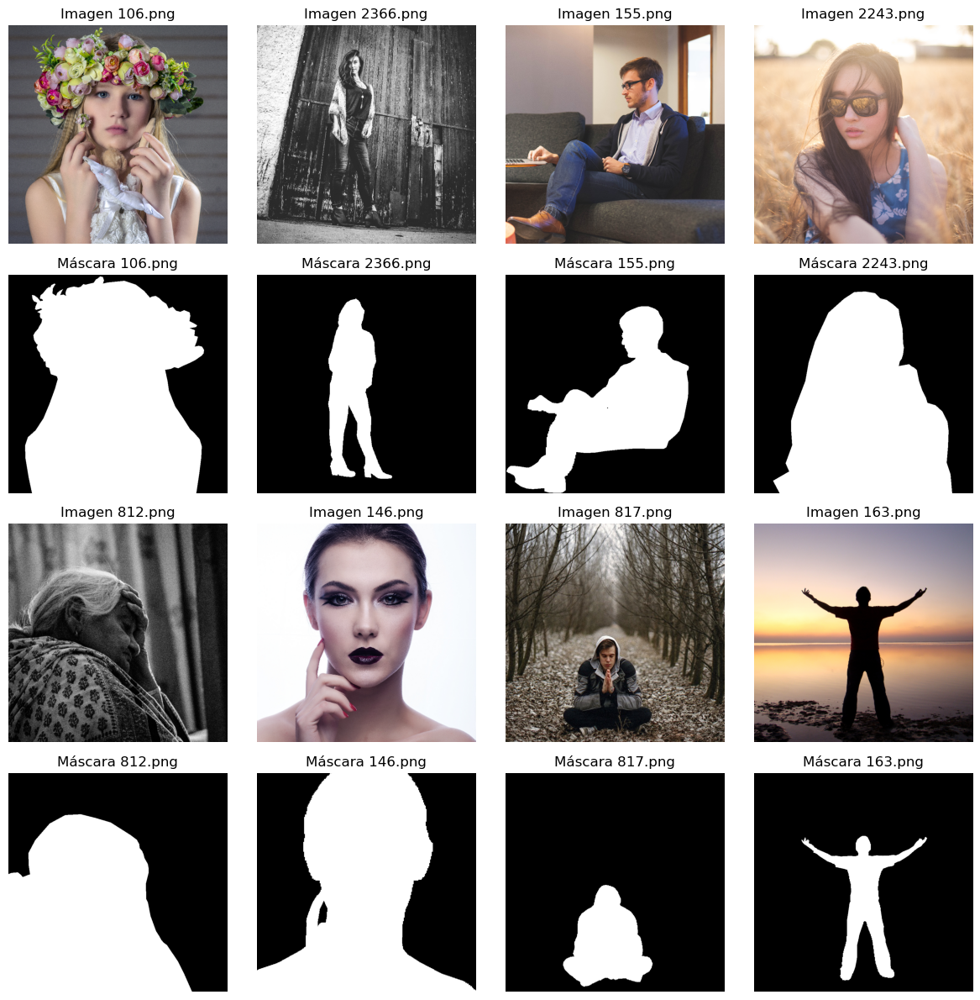

In [ ]:
files = random.sample(os.listdir(IMG_FOLDER), 8)  # 8 imágenes → 4 filas de pares

MASK = None

plt.figure(figsize=(12, 12))
for i, f in enumerate(files):
    img = Image.open(os.path.join(IMG_FOLDER, f))
    mask_path = os.path.join(MASK_FOLDER, f)
    mask = np.array(Image.open(mask_path))
    print(mask.ndim,mask.shape)
    if mask.ndim == 3:
        mask = mask.max(axis=2)

    MASK = mask

    # Fila 1 y 3: imágenes (i=0..3 e i=4..7)
    if i < 4:
        plt.subplot(4, 4, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Imagen {f}")
        plt.subplot(4, 4, i + 1 + 4)
        plt.imshow(mask, cmap="gray", vmin=0, vmax=1)
        plt.axis("off")
        plt.title(f"Máscara {f}")
    else:
        j = i - 4
        plt.subplot(4, 4, j + 1 + 8)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Imagen {f}")
        plt.subplot(4, 4, j + 1 + 12)
        plt.imshow(mask, cmap="gray", vmin=0, vmax=1)
        plt.axis("off")
        plt.title(f"Máscara {f}")

plt.tight_layout()
plt.show()


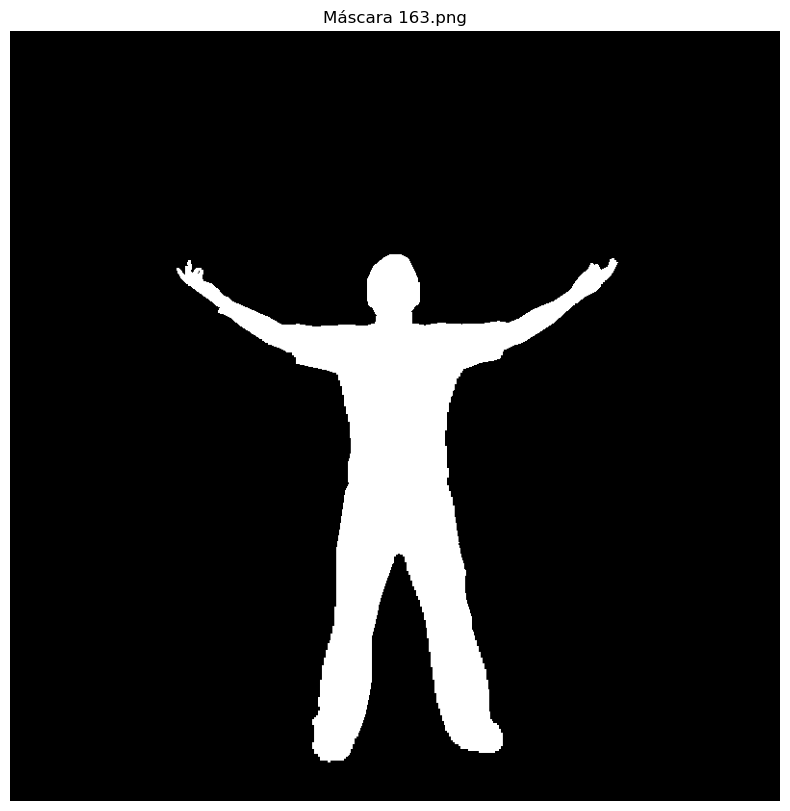

INFORMACIÓN DE LA MATRIZ DE PÍXELES
Forma de la matriz (shape): (800, 800)
Dimensiones de la matriz: 2
Tipo de datos (dtype): uint8
Valor mínimo: 0
Valor máximo: 1
Valor promedio: 0.0959
Valores únicos: [0 1]

Primeros 20x20 píxeles de la matriz:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]

Últimos 20x20 píxeles de la matriz:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
# quiero mostrar una mascara y su matriz de pixeles
plt.figure(figsize=(10, 10))
plt.imshow(MASK, cmap="gray", vmin=0, vmax=1)
plt.axis("off")
plt.title(f"Máscara {f}")
plt.show()

# Mostrar información sobre la matriz de píxeles
print("=" * 60)
print("INFORMACIÓN DE LA MATRIZ DE PÍXELES")
print("=" * 60)
print(f"Forma de la matriz (shape): {MASK.shape}")
# dim
print(f"Dimensiones de la matriz: {MASK.ndim}")
print(f"Tipo de datos (dtype): {MASK.dtype}")
print(f"Valor mínimo: {MASK.min()}")
print(f"Valor máximo: {MASK.max()}")
print(f"Valor promedio: {MASK.mean():.4f}")
print(f"Valores únicos: {np.unique(MASK)}")
print(f"\nPrimeros 20x20 píxeles de la matriz:")
print(MASK[:50, :50])
print(f"\nÚltimos 20x20 píxeles de la matriz:")
print(MASK[-50:, -50:])


## Ver tamaños de imágenes y máscaras

In [ ]:
sizes = set()
for fname in os.listdir(IMG_FOLDER):
    if 'png' in fname:
        path = os.path.join(IMG_FOLDER, fname)
        with Image.open(path) as img:
            sizes.add(img.size)

print("Tamaño de imagenes:")
for size in sizes:
    print(size)

sizes = set()
for fname in os.listdir(MASK_FOLDER):
    if 'png' in fname:
        path = os.path.join(MASK_FOLDER, fname)
        with Image.open(path) as img:
            sizes.add(img.size)

print("Tamaño de máscaras:")
for size in sizes:
    print(size)

Tamaño de imagenes:
(800, 800)
Tamaño de máscaras:
(800, 800)


Confirmamos que todas las imágenes y las máscaras tienen el mismo tamaño.

## Buscar duplicados

In [ ]:
def md5_file(path: Path):
    with path.open("rb") as f:
        return hashlib.md5(f.read()).hexdigest()

hashes = {}
duplicates = []

folder = Path(IMG_FOLDER)

for path in folder.iterdir():
    if path.is_file():
        h = md5_file(path)
        if h in hashes:
            duplicates.append((str(path), str(hashes[h])))
        else:
            hashes[h] = path

print(f"Encontradas {len(duplicates)} imágenes duplicadas.")

Encontradas 0 imágenes duplicadas.


## Formato y canales

In [ ]:
img_dir = Path(IMG_FOLDER)
mask_dir = Path(MASK_FOLDER)

img_channel_counts = set()
mask_channel_counts = set()
mask_unique_values = set()

for img_path, mask_path in zip(sorted(img_dir.iterdir()), sorted(mask_dir.iterdir())):
    if img_path.suffix.lower() not in [".jpg", ".png", ".jpeg"]:
        continue

    # Imagen
    # escala de grises: (hight, width) -> 1 canal
    # RGB: (hight, width, channels) = (height, width, 3) -> 3 canales
    # RGBA: (hight, width, 4)
    try:
        img = np.array(Image.open(img_path))
        img_channels = 1 if img.ndim == 2 else img.shape[2]
        img_channel_counts.add(img_channels)

        # Máscara
        mask = np.array(Image.open(mask_path))
        mask_channels = 1 if mask.ndim == 2 else mask.shape[2]
        mask_channel_counts.add(mask_channels)

        # Valores únicos de cada máscara (agrega como tupla)
        mask_unique_values.add(tuple(np.unique(mask)))
    except:
        pass

print(f"Canales únicos en imágenes: {img_channel_counts}")
print(f"Canales únicos en máscaras: {mask_channel_counts}")
print(f"Conjuntos de valores únicos en máscaras: {mask_unique_values}")

Canales únicos en imágenes: {1, 3, 4}
Canales únicos en máscaras: {3}
Conjuntos de valores únicos en máscaras: {(np.uint8(0), np.uint8(1)), (np.uint8(1),)}


Las máscaras son todas RGB pero para para las imágenes tenemos en formato blanco y negro, RGB y RGBA.

EL RGBA es como RGB más informacion de transparencia de la imagen; este 4to canal no nos aporta información util para este problema.

Para que las imagenes tengan todas la misma cantidad de canales a la entrada de la red, decidimos pasarlas todas a RGB porque RGBA no aporta más información y pasarlo a blanco y negro nos hace perder colores e intensidad que podrian ayudar al modelo a distinguir la persona del fondo.

## Mean y STD

In [10]:
paths = [os.path.join(IMG_FOLDER, f) for f in os.listdir(IMG_FOLDER) if f.lower().endswith(('.png','.jpg','.jpeg','.bmp','.tif','.tiff'))]

# Función de carga forzada a RGB porque algunas estan en RGBA o blanco y negro (L)
def load_rgb(path):
    im = Image.open(path)
    if im.mode != 'RGB':
        im = im.convert('RGB')
    return im

# Media/STD por canal con acumulacion
sum_c = torch.zeros(3, dtype=torch.float64)
sum_sq_c = torch.zeros(3, dtype=torch.float64)
pix_count_c = torch.zeros(3, dtype=torch.float64)

for p in paths:
    try:
        im = load_rgb(p)
        arr = torch.from_numpy(np.asarray(im))  # H x W x 3, uint8
        t = arr.permute(2,0,1).to(torch.float64) / 255.0  # 3 x H x W , [0,1]

        # acumula por canal suma y suma de los cuadrados
        csum = t.view(3, -1).sum(dim=1)
        csum_sq = (t**2).view(3, -1).sum(dim=1)
        n_pix = torch.tensor([t.shape[1]*t.shape[2]]*3, dtype=torch.float64)

        sum_c += csum
        sum_sq_c += csum_sq
        pix_count_c += n_pix
    except Exception as e:
        pass

MEAN_RGB = (sum_c / pix_count_c).to(torch.float32)
STD_RGB = torch.sqrt((sum_sq_c / pix_count_c) - MEAN_RGB.double()**2).to(torch.float32)

print("mean =", MEAN_RGB.tolist(), "std =", STD_RGB.tolist())

mean = [0.5149781107902527, 0.4839880168437958, 0.4597202241420746] std = [0.31370314955711365, 0.3028314411640167, 0.30339837074279785]


**MEAN:**

Los tres canales tienen valores similares por lo que no hay un color que sea mas dominante que otro.

Los valores estan al rededor del 50% lo que indica que las imagenes tienen una exposicion a la luz pareja.

El rojo aparece un poco mas intenso que los demás.

**STD:**

El STD en este caso mide cuánto varía la intensidad de los pixeles en cada canal.

Por lo que vemos, la variacion para los 3 canales es similar. Un valor de 0.3 nos indica que hay bastante variedad de tonos e intensidades; esto probablemente se deba a que las imagenes tienen zonas claras y oscuras, sombras, piel, ropa, y diversos fondos.

## Histograma de colores en las imágenes

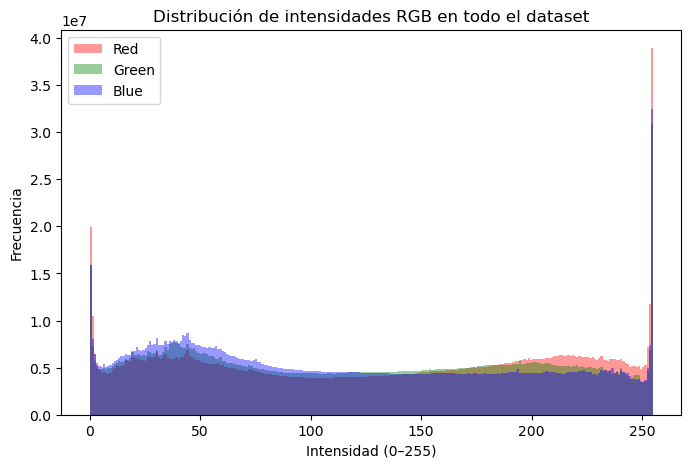

In [ ]:
folder = Path(IMG_FOLDER)

# Acumuladores de cada canal
r_vals, g_vals, b_vals = [], [], []

for p in folder.iterdir():
    if p.suffix.lower() not in [".jpg", ".jpeg", ".png"]:
        continue
    img = np.array(Image.open(p).convert("RGB"))
    # achatar para juntar todos los píxeles
    r, g, b = img[..., 0].ravel(), img[..., 1].ravel(), img[..., 2].ravel()
    r_vals.append(r)
    g_vals.append(g)
    b_vals.append(b)

# concatenar todos los valores
r_vals = np.concatenate(r_vals)
g_vals = np.concatenate(g_vals)
b_vals = np.concatenate(b_vals)

# histograma combinado
plt.figure(figsize=(8,5))
plt.hist(r_vals, bins=256, color='r', alpha=0.4, label='Red')
plt.hist(g_vals, bins=256, color='g', alpha=0.4, label='Green')
plt.hist(b_vals, bins=256, color='b', alpha=0.4, label='Blue')
plt.legend()
plt.title("Distribución de intensidades RGB en todo el dataset")
plt.xlabel("Intensidad (0–255)")
plt.ylabel("Frecuencia")
plt.show()


Los picos en 0 y 255 indican que hay muchos píxeles completamente negros o completamente blancos.

Entre los extremos, vemos que la densidad es relativamente plana, lo que indica amplia variación en los colores.

Las curvas roja, verde y azul son muy similares por lo que vemos que los colores están bastante balanceados en las imagenes del dataset.

## Analizar qué porcentaje de la imagen es ocupado por la persona

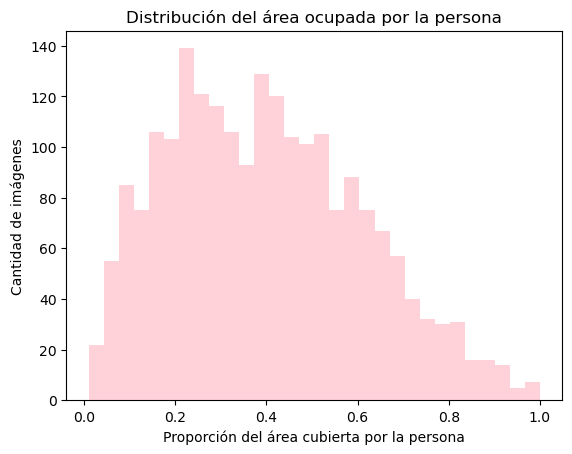

Cobertura promedio: 0.399
Rango: 0.010 – 1.000


In [ ]:
mask_dir = Path(MASK_FOLDER)

coverages = [] # cantidad de pixeles identificados como persona

for p in mask_dir.glob("*.png"):
    mask = np.array(Image.open(p))[:, :, 0]   # un canal, valores {0,1}
    h, w = mask.shape
    coverage = mask.sum() / (h * w)
    coverages.append(coverage)

coverages = np.array(coverages)

plt.hist(coverages, bins=30, color='pink', alpha=0.7)
plt.xlabel("Proporción del área cubierta por la persona") # 0 nada , 1 toda la imagen
plt.ylabel("Cantidad de imágenes")
plt.title("Distribución del área ocupada por la persona")
plt.show()

print(f"Cobertura promedio: {coverages.mean():.3f}")
print(f"Rango: {coverages.min():.3f} – {coverages.max():.3f}")


Podemos ver que en la mayoría de los casos, la persona ocupa el 40% de la imagen, es decir, el 60% de la imagen es el fondo.

Encontradas: 31 imágenes con cobertura <= 0.050


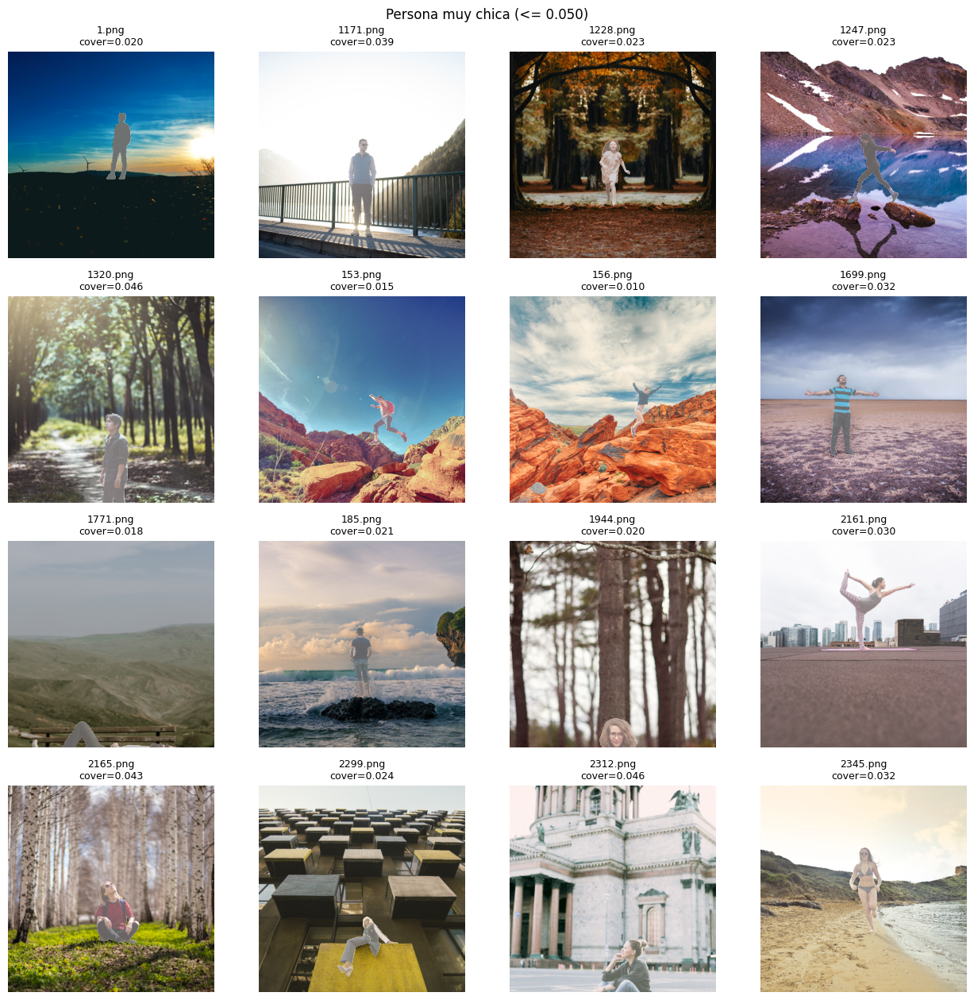

Encontradas: 51 imágenes con cobertura >= 0.850


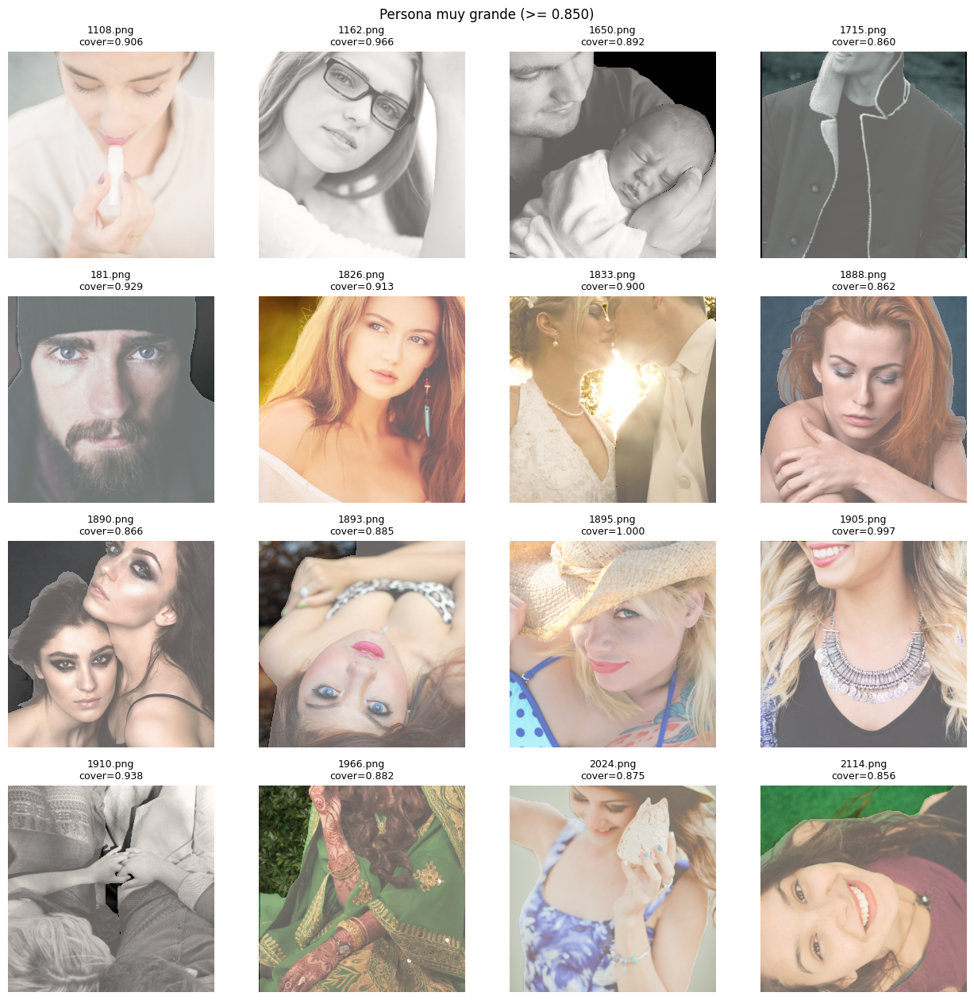

In [14]:
def _read_mask(path):
    m = np.array(Image.open(path))
    if m.ndim == 3:
        m = m[:, :, 0]
    m = (m > 0).astype(np.uint8)
    return m  # HxW en {0,1}

def _read_rgb(path):
    im = Image.open(path)
    if im.mode != "RGB":
        im = im.convert("RGB")
    return np.array(im)      # HxWx3 uint8

def _coverage(mask):
    h, w = mask.shape
    return float(mask.sum()) / float(h * w + 1e-9)

def _build_image_index(image_dir):
    image_dir = Path(image_dir)
    idx = {}
    for p in image_dir.rglob("*"):
        if p.suffix.lower() in {".png",".jpg",".jpeg",".tif",".tiff",".bmp"}:
            idx[p.stem] = p
    return idx

def _overlay(ax, img, mask, alpha=0.35):
    ax.imshow(img)
    ax.imshow(np.where(mask>0, 1.0, np.nan), cmap="Reds", alpha=alpha, interpolation="nearest")
    ax.axis("off")

# persona muy chica (cobertura <= max_frac)

def find_small_person_with_overlay(mask_dir, image_dir, max_frac=0.10, sample_show=12, cols=4, alpha=0.35):
    mask_dir = Path(mask_dir)
    image_idx = _build_image_index(image_dir)

    matches, fracs = [], []
    paths = sorted([p for p in mask_dir.rglob("*") if p.suffix.lower() in {".png",".jpg",".jpeg",".tif",".tiff",".bmp"}])

    for mp in paths:
        m = _read_mask(mp)
        f = _coverage(m)
        if f <= max_frac:
            if mp.stem in image_idx:
                matches.append((image_idx[mp.stem], mp))
                fracs.append(f)

    print(f"Encontradas: {len(matches)} imágenes con cobertura <= {max_frac:.3f}")

    if matches:
        k = min(sample_show, len(matches))
        rows = math.ceil(k / cols)
        plt.figure(figsize=(3.2*cols, 3.2*rows))
        for i, (ip, mp) in enumerate(matches[:k]):
            img = _read_rgb(ip); m = _read_mask(mp)
            ax = plt.subplot(rows, cols, i+1)
            _overlay(ax, img, m, alpha=alpha)
            ax.set_title(f"{ip.name}\ncover={_coverage(m):.3f}", fontsize=9)
        plt.suptitle(f"Persona muy chica (<= {max_frac:.3f})")
        plt.tight_layout()
        plt.show()

    return matches, fracs  # lista de (image_path, mask_path), y coberturas


# persona muy grande (cobertura >= min_frac)

def find_large_person_with_overlay(mask_dir, image_dir, min_frac=0.80, sample_show=12, cols=4, alpha=0.35):
    mask_dir = Path(mask_dir)
    image_idx = _build_image_index(image_dir)

    matches, fracs = [], []
    paths = sorted([p for p in mask_dir.rglob("*") if p.suffix.lower() in {".png",".jpg",".jpeg",".tif",".tiff",".bmp"}])

    for mp in paths:
        m = _read_mask(mp)
        f = _coverage(m)
        if f >= min_frac:
            if mp.stem in image_idx:
                matches.append((image_idx[mp.stem], mp))
                fracs.append(f)

    print(f"Encontradas: {len(matches)} imágenes con cobertura >= {min_frac:.3f}")

    if matches:
        k = min(sample_show, len(matches))
        rows = math.ceil(k / cols)
        plt.figure(figsize=(3.2*cols, 3.2*rows))
        for i, (ip, mp) in enumerate(matches[:k]):
            img = _read_rgb(ip); m = _read_mask(mp)
            ax = plt.subplot(rows, cols, i+1)
            _overlay(ax, img, m, alpha=alpha)
            ax.set_title(f"{ip.name}\ncover={_coverage(m):.3f}", fontsize=9)
        plt.suptitle(f"Persona muy grande (>= {min_frac:.3f})")
        plt.tight_layout()
        plt.show()

    return matches, fracs

# alpha transparencia con la que se superpone imagen y mascara

small, small_fracs = find_small_person_with_overlay(
    mask_dir=MASK_FOLDER, image_dir=IMG_FOLDER,
    max_frac=0.05, sample_show=16, cols=4, alpha=0.4
)

large, large_fracs = find_large_person_with_overlay(
    mask_dir=MASK_FOLDER, image_dir=IMG_FOLDER,
    min_frac=0.85, sample_show=16, cols=4, alpha=0.4
)


## Conclusión de la exploración de datos

El conjunto de datos presenta imagenes y máscaras del mismo tamaño (800×800 px) y sin duplicados.

Las máscaras son todas RGB, mientras que las imágenes originales poseen entre 1, 3 y 4 canales. El canal adicional de las imágenes RGBA corresponde a transparencia, que no aporta información útil para la segmentación; por lo tanto, se decidió convertir todas las imágenes a RGB para unificar la entrada de la red y conservar la información de color relevante. De todas maneras, se probará primero con imagenes de entrada en blanco y negro para ser fieles al paper.

Los valores de MEAN y STD por canal son similares entre sí, confirmando buen balance de colores y bastante variabilidad en intensidades. El histograma de intensidades refuerza estas observaciones, demostrando que el dataset no tiene sesgos de color.

El análisis del espacio ocupado por la persona en la imagen demuestra una ocupación promedio del 40%, con un rango de 0.01 a 1. Esto significa que hay gran variación de escala de personas en las imágenes, donde encontramos tanto primeros planos como imagenes donde la persona está muy chica y es casi todo fondo.

En conclusión, el dataset está balanceado en términos de color y es diverso, lo que es adecuado para entrenar un modelo de segmentación.
Antes del entrenamiento, se deben normalizar las imágenes con los valores calculados de MEAN y STD.

Vamos a probar entrenar con un mínimo de transformaciones para empezar.

Luego veremos si el resultado mejora al aplicar data augmentation, ya que la variabilidad que hay en nuestro dataset ayuda a generalizar pero también hace que sea dificil de aprender.

# Data loaders

El dataset contiene una carpeta train, con imagenes y máscaras, y una carpeta test, solamente con imagenes.

Para poder entrenar y generar métricas, dividiremos la carpeta de train en train/val/test_local con una proporción de 80%/10%/10%.

Definimos la clase SegDataset para generar train/val/test_local manteniendo los pares (imagen, mascara).

Aplicar las transforms aleatorias a mascara e imagen por separado da PROBLEMAS. Por eso definimos un joint transform par aplicar data augmentation, y a los data loaders solo les pasamos la transform base que seria img_rgb o img_simple segun el caso.

In [25]:
import torchvision.transforms.functional as TF
from torchvision.transforms import InterpolationMode

class JointSegAugment:
    def __init__(self, do_flip=True, do_rotate=True, max_angle=10):
        self.do_flip = do_flip
        self.do_rotate = do_rotate
        self.max_angle = max_angle

    def __call__(self, img, mask):
        # img, mask vienen como PIL o tensores; asumamos ya pasaron por base_*_tf
        # pero si querés, podés integrar base_*_tf acá dentro también.

        # Flip horizontal conjunto
        if self.do_flip:
            if torch.rand(1) < 0.5:
                img = TF.hflip(img)
                mask = TF.hflip(mask)

        # Rotación conjunta
        if self.do_rotate:
            angle = float(torch.empty(1).uniform_(-self.max_angle, self.max_angle))
            img = TF.rotate(img, angle, interpolation=InterpolationMode.BILINEAR)
            mask = TF.rotate(mask, angle, interpolation=InterpolationMode.NEAREST)

        return img, mask


In [26]:
def load_image(path, rgb):
        #  "L" convierte a escala de grises
        img = Image.open(path).convert("RGB" if rgb else "L")
        arr = np.array(img, dtype=np.float32) / 255.0  # (H, W, 3) o (H, W)

        if rgb:
            # pasar de (H, W, 3) → (3, H, W)
            arr = np.transpose(arr, (2, 0, 1))
        else:
            # pasar de (H, W) → (1, H, W)
            arr = np.expand_dims(arr, axis=0)

        tensor = torch.from_numpy(arr)
        return tensor

In [27]:
class SegDataset(Dataset):
    """
    Lee pares (imagen, máscara) desde:
      root/images/*.png|jpg...
      root/masks/  con el mismo nombre de archivo
    Devuelve tensores: img -> float32 [0,1], (C,H,W); mask -> long (H,W)
    """
    def __init__(self, root, image_dir="images", mask_dir="masks", transform_img=None, transform_mask=None, joint_transform=None, rgb=False):
        self.root = Path(root)
        self.images_path = self.root / image_dir
        self.masks_path  = self.root / mask_dir
        self.transform_img = transform_img
        self.transform_mask = transform_mask
        self.joint_transform = joint_transform
        self.rgb = rgb

        # Emparejar por nombre
        img_files = sorted([p for p in self.images_path.iterdir() if p.is_file()])
        names = []
        for p in img_files:
            mask_p = self.masks_path / p.name
            if mask_p.exists():
                names.append(p.name)
        if not names:
            raise RuntimeError(f"No se encontraron pares imagen-máscara en {self.images_path} y {self.masks_path}")

        self.names = names  # lista de nombres emparejados

    def __len__(self):
        return len(self.names)

    def _load_mask(self, path):
        # Máscara como enteros de clase. Si es binaria 0/255, la pasamos a 0/1.
        m = Image.open(path)
        if not self.rgb:
            m = m.convert("L")

        arr = np.array(m)
        if arr.dtype != np.uint8:
            arr = arr.astype(np.uint8)
        # binarizar si viene 0/255
        if arr.max() == 255 and arr.min() in (0, 255):
            arr = (arr > 0).astype(np.uint8)
        tensor = torch.from_numpy(arr.astype(np.int64))  # (H,W) long
        return tensor

    def __getitem__(self, idx):
        name = self.names[idx]
        img_path  = self.images_path / name
        mask_path = self.masks_path  / name

        img  = load_image(img_path, self.rgb)
        mask = self._load_mask(mask_path)

        # Transforms opcionales (independientes para img y mask)
        if self.transform_img:
            img = self.transform_img(img)
        if self.transform_mask:
            mask = self.transform_mask(mask)

        # Transforms conjuntas para imagen y mascara
        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)            

        return img, mask


In [28]:
import torchvision.transforms.functional as TF

class SegDatasetRGB(Dataset):
    """
    Lee pares (imagen, máscara) desde:
      root/images/*.png|jpg...
      root/masks/  con el mismo nombre de archivo

    Soporta:
      - Imágenes RGB (rgb=True) o escala de grises (rgb=False).
      - Binario con BCE (mask -> float (1,H,W) en {0,1}) si bce=True.
      - Multiclase con CE (mask -> long (H,W)) si bce=False.

    Transforms:
      - transform_img: se aplica a la imagen (PIL o tensor, según tu pipeline).
      - transform_mask: se aplica a la máscara (usar nearest si hay resize).
    """
    def __init__(self, root, image_dir="images", mask_dir="masks",
                 transform_img=None, transform_mask=None, joint_transform=None,
                 rgb=True, bce=True):
        self.root = Path(root)
        self.images_path = self.root / image_dir
        self.masks_path  = self.root / mask_dir
        self.transform_img = transform_img
        self.transform_mask = transform_mask
        self.joint_transform = joint_transform
        self.rgb = rgb          # True -> RGB (3 canales), False -> L (1 canal)
        self.bce = bce          # True -> binario+BCE, False -> multiclase+CE

        img_files = sorted([p for p in self.images_path.iterdir() if p.is_file()])
        names = []
        for p in img_files:
            if (self.masks_path / p.name).exists():
                names.append(p.name)
        if not names:
            raise RuntimeError(f"No se encontraron pares imagen-máscara en {self.images_path} y {self.masks_path}")
        self.names = names

    def __len__(self):
        return len(self.names)

    def _load_image(self, path):
        im = Image.open(path)
        im = im.convert("RGB") if self.rgb else im.convert("L")  # decide 3c vs 1c
        # Si no hay transform, convertimos a tensor [0,1] por defecto
        x = self.transform_img(im) if self.transform_img is not None else T.ToImage()(im)
        return x  # (C,H,W) con C=3 si rgb else C=1

    def _load_mask(self, path):
        m = Image.open(path).convert("RGB")  # vienen RGB en el dataset
        arr = np.array(m)  # (H,W,3) uint8 esperado

        if self.bce:
            # Binario: cualquier pixel != fondo es 1
            # (fondo negro)
            bin_hw = (arr.max(axis=2) > 0).astype(np.float32)  # (H,W) {0,1}
            t = torch.from_numpy(bin_hw).unsqueeze(0)  # (1,H,W)
            # Transform opcional para máscara
            if self.transform_mask is not None:
                t = self.transform_mask(t)
            # Asegurar dtype/shape finales para BCE
            t = t.float()
            if t.dim() == 3 and t.shape[0] != 1:
                # si algún transform cambió canales, colapsar a 1 con max (defensivo)
                t = t.max(dim=0, keepdim=True).values
            return t  # (1,H,W) float
        else:
            # Multiclase
            # Como placeholder: colapsamos a 0/1 y devolvemos long (H,W)
            cls_hw = (arr.max(axis=2) > 0).astype(np.int64)  # (H,W)
            t = torch.from_numpy(cls_hw)
            if self.transform_mask is not None:
                t = self.transform_mask(t)
            return t.long()  # (H,W)

    def __getitem__(self, idx):
        name = self.names[idx]
        img_path  = self.images_path / name
        mask_path = self.masks_path  / name

        x = self._load_image(img_path)
        y = self._load_mask(mask_path)
        
        img  = load_image(img_path, self.rgb)
        mask = self._load_mask(mask_path)
        # Transforms opcionales (independientes para img y mask)
        if self.transform_img:
            img = self.transform_img(img)
        if self.transform_mask:
            mask = self.transform_mask(mask)

        # Transforms conjuntas para imagen y mascara
        if self.joint_transform is not None:
            img, mask = self.joint_transform(img, mask)        

        return x, y


In [29]:
class TestSegmentationDataset(Dataset):
    """
    Lee solo imágenes desde root/images y devuelve (tensor_imagen, nombre_archivo).
    No busca máscaras.
    """
    def __init__(self, image_dir=TEST_FOLDER, transform=None, rgb=False):
        self.images_path = Path(image_dir)
        self.transform = transform
        self.rgb = rgb

        self.names = sorted([p.name for p in self.images_path.iterdir() if p.is_file()])

    def __len__(self):
        return len(self.names)

    def __getitem__(self, idx):
        name = self.names[idx]
        img_path = self.images_path / name

        x = load_image(img_path, self.rgb)

        if self.transform:
            x = self.transform(x)

        return x, name


In [30]:
def get_seg_dataloaders(
    root,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    seed=SEED,
    rgb=False,
    train_transform_img=None,
    train_transform_mask=None,
    val_transform_img=None,
    val_transform_mask=None,
    joint_transform_train=None,
    joint_transform_val=None
):
    """
    Genera tres DataLoaders (train, val, test) a partir de un dataset generado con la clase SegDataset.

    Parámetros
    ----------
    root : str o Path
        Ruta a la carpeta que contiene 'images' y 'masks'.
        Ejemplo: "data/train"
    batch_size
    num_workers
    seed
    rgb : bool, opcional
        Si es True, las imágenes se cargan en RGB; si es False, en escala de grises.
    train_transform_img
    train_transform_mask
    val_transform_img
    val_transform_mask

    Retorna
    -------
    train_loader : Dataloader del conjunto de entrenamiento (80% de los datos).
    val_loader : Dataloader del conjunto de validación (10% de los datos).
    test_loader : Dataloader del conjunto de test (10% de los datos).
    """
    # dataset completo
    full_ds = SegDataset(root=root, rgb=rgb, transform_img=None, transform_mask=None)

    n = len(full_ds)
    n_train = int(0.8 * n)
    n_val   = int(0.1 * n)
    n_test  = n - n_train - n_val

    # sacamos los indices de los (image,mask) que van a ir a cada dataloader
    g = torch.Generator().manual_seed(seed)
    train_idxs, val_idxs, test_idxs = random_split(full_ds, [n_train, n_val, n_test], generator=g)

    if rgb:
        train_ds = SegDatasetRGB(root=root, rgb=rgb, bce=True,
                              transform_img=train_transform_img,
                              transform_mask=train_transform_mask,
                                joint_transform=joint_transform_train)
    
        val_ds = SegDatasetRGB(root=root, rgb=rgb, bce=True,
                            transform_img=val_transform_img,
                            transform_mask=val_transform_mask,
                              joint_transform=joint_transform_val)
    
        test_ds = SegDatasetRGB(root=root, rgb=rgb, bce=True,
                             transform_img=val_transform_img,
                             transform_mask=val_transform_mask,
                               )
    else:
        train_ds = SegDataset(root=root, rgb=rgb,
                              transform_img=train_transform_img,
                              transform_mask=train_transform_mask,
                             joint_transform=joint_transform_train)
    
        val_ds = SegDataset(root=root, rgb=rgb,
                            transform_img=val_transform_img,
                            transform_mask=val_transform_mask,
                           joint_transform=joint_transform_val)
    
        test_ds = SegDataset(root=root, rgb=rgb,
                             transform_img=val_transform_img,
                             transform_mask=val_transform_mask,
                            joint_transform=joint_transform_val)
        
    test_ds_kaggle = TestSegmentationDataset(transform=val_transform_img, rgb=rgb)

    # Subset usando los índices del split original
    train_ds = Subset(train_ds, train_idxs.indices)
    val_ds   = Subset(val_ds, val_idxs.indices)
    test_ds  = Subset(test_ds, test_idxs.indices)

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    val_loader   = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)
    test_loader  = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)
    kaggle_loader = DataLoader(test_ds_kaggle, batch_size=batch_size, shuffle=False, num_workers=num_workers) # batch size 1 PROBAR TODO:


    return train_loader, val_loader, test_loader, kaggle_loader

# Transforms

In [23]:
# Re calculamos MEAN y STD para imagenes en blanco y negro.
imgs = []
for p in Path(IMG_FOLDER).iterdir():
    img = Image.open(p).convert("L")
    arr = np.array(img, dtype=np.float32) / 255.0
    imgs.append(arr)

arr = np.stack(imgs)
MEAN_BYN = arr.mean()
STD_BYN = arr.std()

print(f"Mean: {MEAN_BYN} ; STD: {STD_BYN}")

Mean: 0.4904860854148865 ; STD: 0.2986582815647125


In [24]:
###### TRANSFORMS BASICAS PARA APLICAR A TODOS COMO BASE
base_img_tf_byn = T.Compose(
    [
        T.ToImage(), 
        T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.BILINEAR),
        T.ToDtype(torch.float32, scale=True), 
        T.Normalize(mean=(float(MEAN_BYN),), std=(float(STD_BYN),)),
    ]
)
base_mask_tf_byn = T.Compose(
    [
        T.ToImage(), 
        T.Resize((IMG_SIZE, IMG_SIZE)),
        T.ToDtype(torch.int64, scale=True), 
    ]
)

base_img_tf = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.BILINEAR),
        T.ToDtype(torch.float32, scale=True),
        T.Normalize(mean=MEAN_RGB, std=STD_RGB),
    ]
)

base_mask_tf = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.NEAREST),
        T.ToDtype(torch.int64, scale=False),
    ]
)

##################################################################


################################################################## 
############ TRANSFORMS CON AUGMENTATION #########################
train_transform_img_simple_augmented = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.BILINEAR),
        
        # Augmentation
        T.RandomHorizontalFlip(p=0.5), # Espejar 
        T.RandomRotation(degrees=(-10, 10)), 
        
        T.ToDtype(torch.float32, scale=True),
        T.Normalize(mean=(float(MEAN_BYN),), std=(float(STD_BYN),)),
    ]
)
train_transform_mask_simple_augmented = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.NEAREST),

        T.RandomHorizontalFlip(p=0.5),
        T.RandomRotation(degrees=(-10, 10), interpolation=T.InterpolationMode.NEAREST),
        
        T.ToDtype(torch.int64, scale=False),
    ]
)
train_transform_img_rgb_augmented = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.BILINEAR),
        
        # Augmentation
        T.RandomHorizontalFlip(p=0.5), # Espejar (Flip)
        T.RandomRotation(degrees=(-10, 10)), # Rotar la imagen
        
        # Otros útiles para segmentación (opcional, probar):
        # T.ColorJitter(brightness=0.2, contrast=0.2), # Variación de color (solo para RGB)
        # T.GaussianBlur(kernel_size=5, sigma=(0.1, 2.0), p=0.2), # Desenfoque (si el entorno lo requiere)

        T.ToDtype(torch.float32, scale=True),
        T.Normalize(mean=MEAN_RGB, std=STD_RGB),
    ]
)
train_transform_mask_rgb_augmented = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.NEAREST),

        T.RandomHorizontalFlip(p=0.5),
        T.RandomRotation(degrees=(-10, 10), interpolation=T.InterpolationMode.NEAREST),
        
        T.ToDtype(torch.int64, scale=False),
    ]
)


##################################################################

# Arquitectura UNet

En el [paper de UNet](https://arxiv.org/pdf/1505.04597) se define la arquitectura de la red como se muestra en la imagen:


![https://arxiv.org/pdf/1505.04597](assets/UNet_arquitecture.png)

Como entrada a la red tenemos "recortes" de las imagenes originales. Esto se hace asi en el paper porque las imagenes con las que querian entrenar eran demasiado grandes. Estos recortes se ensamblan de nuevo al pasar por el camino de salida.

Las imágenes de entrada son de 1 canal, es decir, en blanco y negro.

Tenemos 4 niveles del lado izquierdo, un cuello de botella al final y luego 4 niveles mas del lado derecho. Éstos se componen de la siguiente manera:

**CONTRACTING PATH (LEFT)**

Conv 3x3 sin padding -> ReLU -> Conv 3x3 sin padding -> ReLU -> Guardar feature map -> MaxPool 2x2 stride 2 -> Aumentar cantidad de canales

Repetir bloque 4 veces.

**BOTTLE NECK**

Conv 3x3 sin padding -> ReLU -> Conv 3x3 sin padding -> ReLU

**EXPANSIVE PATH (RIGHT)**

UpConv 2x2 (reduce a la mitad los canales) -> Recortar feature map del encoder para igualar tamaños y concatenar con el recortado (skip connection) -> Conv 3x3 sin padding -> ReLU -> Conv 3x3 sin padding -> ReLU

Repetir bloque 4 veces.

**SALIDA**

Conv 1x1 (mapear cada pixel del feature map al numero de clases)

<u>Tener en cuenta:</u>

* Si se hace N veces un Max Pool 2x2 => el size de la imagen de entrada debe ser divisible entre 2^N.
* Como se hacen convoluciones sin padding, el size de la imagen de entrada tiene que ser mayor al size de salida deseado.
* Para que al recomponer los "recortes" no aparezcan bordes o espacios, hay que elegir tamaños que respeten tambien el ser divisibles entre 2^N.


# Modelo UNet 

Implementaremos la UNet tal y como se la presenta en el paper pero con algunas mejoras.

In [31]:
def center_crop(x, th, tw):
    if x.dim() == 3:  # por torchinfo
        _, h, w = x.shape
        dy = (h - th) // 2
        dx = (w - tw) // 2
        return x[:, dy:dy+th, dx:dx+tw]
    elif x.dim() == 4:
        _, _, h, w = x.shape # tamaño del mapa del encoder
        dy = (h - th) // 2   # recorte superior e inferior
        dx = (w - tw) // 2   # recorte izquierdo y derecho
        return x[:, :, dy:dy+th, dx:dx+tw]


def make_block(in_ch, out_ch, padding=0, use_bn=False, dropout=0.0):
    layers = [nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=padding)]
    if use_bn:
        layers.append(nn.BatchNorm2d(out_ch))
    layers.append(nn.ReLU(inplace=True))
    if dropout > 0.0:
        layers.append(nn.Dropout2d(dropout))
    return nn.Sequential(*layers)


class UNet(nn.Module):
    def __init__(self, n_class, n_channels=1, padding=0, use_bn=False, dropout=0.0):
        super().__init__()

        self.padding = padding

        # ================ ENCODER ================
        self.conv1  = make_block(n_channels, 64,  padding, use_bn, dropout)
        self.conv2  = make_block(64,        64,  padding, use_bn, dropout)
        self.conv3  = make_block(64,        128, padding, use_bn, dropout)
        self.conv4  = make_block(128,       128, padding, use_bn, dropout)
        self.conv5  = make_block(128,       256, padding, use_bn, dropout)
        self.conv6  = make_block(256,       256, padding, use_bn, dropout)
        self.conv7  = make_block(256,       512, padding, use_bn, dropout)
        self.conv8  = make_block(512,       512, padding, use_bn, dropout)

        # ================ BOTTLENECK ================
        self.conv9  = make_block(512,       1024, padding, use_bn, dropout)
        self.conv10 = make_block(1024,      1024, padding, use_bn, dropout)

        # ================ DECODER CONVS ================
        self.conv11 = make_block(1024, 512, padding, use_bn, dropout)  # d4
        self.conv12 = make_block(512,  512, padding, use_bn, dropout)

        self.conv13 = make_block(512,  256, padding, use_bn, dropout)  # d3
        self.conv14 = make_block(256,  256, padding, use_bn, dropout)

        self.conv15 = make_block(256,  128, padding, use_bn, dropout)  # d2
        self.conv16 = make_block(128,  128, padding, use_bn, dropout)

        self.conv17 = make_block(128,   64, padding, use_bn, dropout)  # d1
        self.conv18 = make_block(64,    64, padding, use_bn, dropout)

        # ================ UPCONVS ================
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.upconv2 = nn.ConvTranspose2d(512,  256, kernel_size=2, stride=2)
        self.upconv3 = nn.ConvTranspose2d(256,  128, kernel_size=2, stride=2)
        self.upconv4 = nn.ConvTranspose2d(128,   64, kernel_size=2, stride=2)

        self.maxPool = nn.MaxPool2d(2)
        self.outconv = nn.Conv2d(64, n_class, kernel_size=1)

    def forward(self, x):
        # ================ ENCODER ================
        e1 = self.conv1(x)
        e1 = self.conv2(e1)
        p1 = self.maxPool(e1)

        e2 = self.conv3(p1)
        e2 = self.conv4(e2)
        p2 = self.maxPool(e2)

        e3 = self.conv5(p2)
        e3 = self.conv6(e3)
        p3 = self.maxPool(e3)

        e4 = self.conv7(p3)
        e4 = self.conv8(e4)
        p4 = self.maxPool(e4)

        # ================ BOTTLENECK ================
        b = self.conv9(p4)
        b = self.conv10(b)

        # ================ DECODER ================
        d4 = self.upconv1(b)
        # recorto siempre que sea necesario
        if e4.shape[2:] != d4.shape[2:]:
            e4_ = center_crop(e4, d4.shape[2], d4.shape[3])
        else:
            e4_ = e4
        d4 = torch.cat([e4_, d4], dim=1)
        d4 = self.conv11(d4)
        d4 = self.conv12(d4)

        d3 = self.upconv2(d4)
        if e3.shape[2:] != d3.shape[2:]:
            e3_ = center_crop(e3, d3.shape[2], d3.shape[3])
        else:
            e3_ = e3
        d3 = torch.cat([e3_, d3], dim=1)
        d3 = self.conv13(d3)
        d3 = self.conv14(d3)

        d2 = self.upconv3(d3)
        if e2.shape[2:] != d2.shape[2:]:
            e2_ = center_crop(e2, d2.shape[2], d2.shape[3])
        else:
            e2_ = e2
        d2 = torch.cat([e2_, d2], dim=1)
        d2 = self.conv15(d2)
        d2 = self.conv16(d2)

        d1 = self.upconv4(d2)
        if e1.shape[2:] != d1.shape[2:]:
            e1_ = center_crop(e1, d1.shape[2], d1.shape[3])
        else:
            e1_ = e1
        d1 = torch.cat([e1_, d1], dim=1)
        d1 = self.conv17(d1)
        d1 = self.conv18(d1)

        # ================ OUTPUT ================
        return self.outconv(d1)


In [32]:
model_2 = UNet(n_class=1, n_channels=3, padding=1, use_bn=True)  # por ejemplo
summary(model_2, input_size=(1, 3, 572, 572)) # input size = batch_size, channels, h, w)

Layer (type:depth-idx)                   Output Shape              Param #
UNet                                     [1, 1, 560, 560]          --
├─Sequential: 1-1                        [1, 64, 572, 572]         --
│    └─Conv2d: 2-1                       [1, 64, 572, 572]         1,792
│    └─BatchNorm2d: 2-2                  [1, 64, 572, 572]         128
│    └─ReLU: 2-3                         [1, 64, 572, 572]         --
├─Sequential: 1-2                        [1, 64, 572, 572]         --
│    └─Conv2d: 2-4                       [1, 64, 572, 572]         36,928
│    └─BatchNorm2d: 2-5                  [1, 64, 572, 572]         128
│    └─ReLU: 2-6                         [1, 64, 572, 572]         --
├─MaxPool2d: 1-3                         [1, 64, 286, 286]         --
├─Sequential: 1-4                        [1, 128, 286, 286]        --
│    └─Conv2d: 2-7                       [1, 128, 286, 286]        73,856
│    └─BatchNorm2d: 2-8                  [1, 128, 286, 286]        256
│

# Modelo UNet + Attention

Referencia: https://arxiv.org/pdf/1804.03999

In [33]:
class AttentionGate(nn.Module):
    """
    Attention gate.

    g: feature del decoder (gating signal)
    x: feature del encoder (skip connection)
    """
    def __init__(self, in_g, in_x, inter_ch):
        super().__init__()
        # Proyecciones a espacio intermedio
        self.Wg = nn.Conv2d(in_g, inter_ch, kernel_size=1, stride=1, padding=0, bias=True)
        self.Wx = nn.Conv2d(in_x, inter_ch, kernel_size=1, stride=1, padding=0, bias=True)
        # Conv para producir mapa de atención
        self.psi = nn.Conv2d(inter_ch, 1, kernel_size=1, stride=1, padding=0, bias=True)

        self.relu = nn.ReLU(inplace=True)
        self.sigmoid = nn.Sigmoid()

    def forward(self, g, x):
        # Se asume que g y x ya tienen mismas H,W
        g1 = self.Wg(g)
        x1 = self.Wx(x)
        psi = self.relu(g1 + x1)
        psi = self.sigmoid(self.psi(psi))     # (B,1,H,W)
        return x * psi                        # atenúa/amplifica canales de x por píxel


class UNetAttention(nn.Module):
    def __init__(self, n_class, n_channels=1, padding=0,
                 use_bn=False, dropout=0.0, use_attention=True):
        super().__init__()

        self.padding = padding
        self.use_attention = use_attention

        # ================ ENCODER ================
        self.conv1  = make_block(n_channels, 64,  padding, use_bn, dropout)
        self.conv2  = make_block(64,        64,  padding, use_bn, dropout)
        self.conv3  = make_block(64,        128, padding, use_bn, dropout)
        self.conv4  = make_block(128,       128, padding, use_bn, dropout)
        self.conv5  = make_block(128,       256, padding, use_bn, dropout)
        self.conv6  = make_block(256,       256, padding, use_bn, dropout)
        self.conv7  = make_block(256,       512, padding, use_bn, dropout)
        self.conv8  = make_block(512,       512, padding, use_bn, dropout)

        # ================ BOTTLENECK ================
        self.conv9  = make_block(512,       1024, padding, use_bn, dropout)
        self.conv10 = make_block(1024,      1024, padding, use_bn, dropout)

        # ================ DECODER CONVS ================
        self.conv11 = make_block(1024, 512, padding, use_bn, dropout)  # d4
        self.conv12 = make_block(512,  512, padding, use_bn, dropout)

        self.conv13 = make_block(512,  256, padding, use_bn, dropout)  # d3
        self.conv14 = make_block(256,  256, padding, use_bn, dropout)

        self.conv15 = make_block(256,  128, padding, use_bn, dropout)  # d2
        self.conv16 = make_block(128,  128, padding, use_bn, dropout)

        self.conv17 = make_block(128,   64, padding, use_bn, dropout)  # d1
        self.conv18 = make_block(64,    64, padding, use_bn, dropout)

        # ================ UPCONVS ================
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.upconv2 = nn.ConvTranspose2d(512,  256, kernel_size=2, stride=2)
        self.upconv3 = nn.ConvTranspose2d(256,  128, kernel_size=2, stride=2)
        self.upconv4 = nn.ConvTranspose2d(128,   64, kernel_size=2, stride=2)

        self.maxPool = nn.MaxPool2d(2)
        self.outconv = nn.Conv2d(64, n_class, kernel_size=1)

        # ================ ATTENTION GATES ================
        if self.use_attention:
            # Para cada nivel, g = feature del decoder, x = feature del encoder
            self.att4 = AttentionGate(in_g=512, in_x=512, inter_ch=256)  # nivel e4-d4
            self.att3 = AttentionGate(in_g=256, in_x=256, inter_ch=128)  # nivel e3-d3
            self.att2 = AttentionGate(in_g=128, in_x=128, inter_ch=64)   # nivel e2-d2
            self.att1 = AttentionGate(in_g=64,  in_x=64,  inter_ch=32)   # nivel e1-d1

    def forward(self, x):
        # ================ ENCODER ================
        e1 = self.conv1(x)
        e1 = self.conv2(e1)
        p1 = self.maxPool(e1)

        e2 = self.conv3(p1)
        e2 = self.conv4(e2)
        p2 = self.maxPool(e2)

        e3 = self.conv5(p2)
        e3 = self.conv6(e3)
        p3 = self.maxPool(e3)

        e4 = self.conv7(p3)
        e4 = self.conv8(e4)
        p4 = self.maxPool(e4)

        # ================ BOTTLENECK ================
        b = self.conv9(p4)
        b = self.conv10(b)

        # ================ DECODER ================
        # ---- Nivel 4 (más profundo) ----
        d4 = self.upconv1(b)  # (B,512,H',W')

        # Alinear tamaños encoder/decoder
        if e4.shape[2:] != d4.shape[2:]:
            e4_ = center_crop(e4, d4.shape[2], d4.shape[3])
        else:
            e4_ = e4

        if self.use_attention:
            e4_ = self.att4(d4, e4_)  # filtra skip con atención

        d4 = torch.cat([e4_, d4], dim=1)
        d4 = self.conv11(d4)
        d4 = self.conv12(d4)

        # ---- Nivel 3 ----
        d3 = self.upconv2(d4)  # (B,256,H',W')

        if e3.shape[2:] != d3.shape[2:]:
            e3_ = center_crop(e3, d3.shape[2], d3.shape[3])
        else:
            e3_ = e3

        if self.use_attention:
            e3_ = self.att3(d3, e3_)

        d3 = torch.cat([e3_, d3], dim=1)
        d3 = self.conv13(d3)
        d3 = self.conv14(d3)

        # ---- Nivel 2 ----
        d2 = self.upconv3(d3)  # (B,128,H',W')

        if e2.shape[2:] != d2.shape[2:]:
            e2_ = center_crop(e2, d2.shape[2], d2.shape[3])
        else:
            e2_ = e2

        if self.use_attention:
            e2_ = self.att2(d2, e2_)

        d2 = torch.cat([e2_, d2], dim=1)
        d2 = self.conv15(d2)
        d2 = self.conv16(d2)

        # ---- Nivel 1 (más superficial) ----
        d1 = self.upconv4(d2)  # (B,64,H',W')

        if e1.shape[2:] != d1.shape[2:]:
            e1_ = center_crop(e1, d1.shape[2], d1.shape[3])
        else:
            e1_ = e1

        if self.use_attention:
            e1_ = self.att1(d1, e1_)

        d1 = torch.cat([e1_, d1], dim=1)
        d1 = self.conv17(d1)
        d1 = self.conv18(d1)

        # ================ OUTPUT ================
        return self.outconv(d1)      

In [34]:
model_test = UNetAttention(
    n_class=1,
    n_channels=3,    
    padding=1,
    use_bn=False,    
    dropout=0.1,
    use_attention=True
) 
summary(model_test, input_size=(1, 3, 572, 572)) # input size = batch_size, channels, h, w)

Layer (type:depth-idx)                   Output Shape              Param #
UNetAttention                            [1, 1, 560, 560]          --
├─Sequential: 1-1                        [1, 64, 572, 572]         --
│    └─Conv2d: 2-1                       [1, 64, 572, 572]         1,792
│    └─ReLU: 2-2                         [1, 64, 572, 572]         --
│    └─Dropout2d: 2-3                    [1, 64, 572, 572]         --
├─Sequential: 1-2                        [1, 64, 572, 572]         --
│    └─Conv2d: 2-4                       [1, 64, 572, 572]         36,928
│    └─ReLU: 2-5                         [1, 64, 572, 572]         --
│    └─Dropout2d: 2-6                    [1, 64, 572, 572]         --
├─MaxPool2d: 1-3                         [1, 64, 286, 286]         --
├─Sequential: 1-4                        [1, 128, 286, 286]        --
│    └─Conv2d: 2-7                       [1, 128, 286, 286]        73,856
│    └─ReLU: 2-8                         [1, 128, 286, 286]        --
│   

# Entrenamiento

## Funciones Auxiliares

### Dice Loss

$$
\text{Dice} = \frac{2 \cdot |A \cap B|}{|A| + |B|}
$$

In [35]:
@torch.no_grad()
def dice_binaria(logits, target, threshold=0.5, eps=1e-7):
    if logits.dim()==3: logits = logits.unsqueeze(1)
    if target.dim()==3: target = target.unsqueeze(1)
    probs = torch.sigmoid(logits)
    preds = (probs >= threshold).float()
    target = (target > 0).float()
    inter = (preds * target).sum(dim=(1,2,3))
    denom = preds.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3))
    dice = torch.where(denom>0, (2*inter+eps)/(denom+eps), torch.ones_like(denom))
    return dice.mean()


In [36]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=0.0):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        preds = (probs >= 0.5).float()

        if target.dim() == 3:
            target = target.unsqueeze(1)
        target = target.float()

        dice = get_dice(probs, targets, self.smooth)
        diceLoss = 1 - dice
        return diceLoss


In [37]:
############# NUEVA LOSS: Dice + BCEWithLogits #######################################

# Suponiendo que 'targets' y 'logits' tienen forma (Batch, 1, H, W)

# Opcional: Calcula pesos para balancear (e.g., usando la frecuencia inversa)
# Si background es 60% y foreground 40%, podrías usar pos_weight=1.5
# (0.6 / 0.4 = 1.5)
# pos_weight penaliza los Falsos Negativos (importante para foreground).
#pos_weight = torch.tensor(1.5) # Ejemplo de peso
#bce_criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

#bce_loss = bce_criterion(logits, targets)


def dice_loss(pred_logits, target, smooth=1e-6):
    # 1. Aplicar Sigmoide para obtener probabilidades
    pred = torch.sigmoid(pred_logits)

    # Aplanar las dimensiones espaciales para el cálculo (H*W)
    pred = pred.view(-1)
    target = target.view(-1)

    # 2. Calcular la intersección y la suma de las áreas
    # Intersección: P * G (element-wise multiplication)
    intersection = (pred * target).sum()

    # Suma: P + G
    dice_score = (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

    # 3. Dice Loss
    return 1 - dice_score

def combined_loss(logits, targets, lambda_dice=0.7, pos_weight=1.5, ponderada=False):
    if ponderada:
        # Aseguramos tipo correcto para BCE
        if targets.dtype != torch.float32:
            targets = targets.float()
    
        dice_l = dice_loss(logits, targets)
        bce_criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor(pos_weight))
        bce_l  = bce_criterion(logits, targets)
    
        return lambda_dice * dice_l + (1 - lambda_dice) * bce_l
    else:
        # 1. Definir la BCE Loss (con pesos)
        bce_criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor(pos_weight))
        bce_l = bce_criterion(logits, targets)
    
        # 2. Definir la Dice Loss
        dice_l = dice_loss(logits, targets)
    
        # 3. Combinar
        total_loss = lambda_dice * dice_l + (1 - lambda_dice) * bce_l
        return total_loss

# Uso en el loop de entrenamiento:
# loss = combined_loss(logits, targets)
# loss.backward()
###########################################################################################


Tenemos más fondo que persona. La BCE, que se fija pixel por pixel, termina dandole mas peso al fondo entonces la Dice nos da mas baja.

Definimos entonces una loss combinada ponderada para resolver esta diferencia de pesos:

### Model segmentation report
Creamos una nueva funcion para el classification report:

In [38]:
# NCLASSES = 1
@torch.no_grad()
def model_segmentation_report(model, dataloader, device, nclasses, do_confusion_matrix=True, show_dice_loss=True, threshold=0.5):

    model.eval()
    ys, ps = [], []
    dice_vals = []

    for x, y in dataloader:
        x = x.to(device)
        y = y.to(device)  # y: (N,H,W) long
        logits = model(x)                         # (N,C,h,w)
        logits = F.interpolate(logits, size=y.shape[-2:], mode='bilinear', align_corners=False)

        # Alinear tamaños
        #logits = match_output_dim(logits, y)

        if show_dice_loss and nclasses == 1:
            dice_vals.append(dice_binaria(logits, y).item())

        if nclasses == 1:
            probs = torch.sigmoid(logits)
            pred = (probs >= threshold).long().squeeze(1)  # (N,h,w)          

        # Aplanar por píxel
        ys.append(y.detach().cpu().numpy().ravel())
        ps.append(pred.detach().cpu().numpy().ravel())

    y_true = np.concatenate(ys, axis=0)
    y_pred = np.concatenate(ps, axis=0)

    labels = [0,1] if nclasses == 1 else list(range(nclasses))
    target_names = ['no-persona','persona'] if nclasses == 1 else [str(i) for i in labels]    

    acc = accuracy_score(y_true, y_pred)
    report = classification_report(
        y_true, y_pred,
        labels=labels,
        target_names=target_names,
        output_dict=True,
        zero_division=0
    )

    if report.get("accuracy") is not None and not isinstance(report["accuracy"], dict):
        report["accuracy"] = {"f1-score": report["accuracy"]}

    if show_dice_loss and nclasses == 1:
        mean_dice = float(np.mean(dice_vals)) if dice_vals else 0.0
        # por clase positiva "1"
        report.setdefault("1", {})["dice"] = mean_dice
        # promedios
        report.setdefault("macro avg", {})["dice"] = mean_dice
        report.setdefault("weighted avg", {})["dice"] = mean_dice

    print(f"Accuracy: {acc:.4f}")
    print_metrics_report(report)

    cm = None
    if do_confusion_matrix:
        cm = confusion_matrix(y_true, y_pred, labels=labels)
        plot_confusion_matrix(cm, title="Confusion matrix")

    return acc, report, cm


## Entrenando UNet original

Entrenamos la UNet con su arquitectura original, respetando padding = 0, batch size = 1 e imágenes de entrada en blanco y negro.

In [36]:
train_loader_1, val_loader_1, test_loader_1, kaggle_loader_1 = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=train_transform_img_simple,
                                                            train_transform_mask=train_transform_mask_simple,
                                                            val_transform_img=val_transform_img,
                                                            val_transform_mask=val_transform_mask)

In [19]:
model_1_2 = UNet(n_class=1).to(DEVICE)
criterion_1_2 = nn.BCEWithLogitsLoss()
optimizer_1_2  = torch.optim.Adam(model_1_2.parameters(), lr=1e-3)

In [20]:
epoch_train_errors_1_2, epoch_val_errors_1_2 = train(model_1_2, optimizer_1_2, criterion_1_2,
                                                 train_loader_1, val_loader_1, DEVICE,
                                                 do_early_stopping=False, epochs=10)

Epoch: 001 | Train Loss: 0.67089 | Val Loss: 0.65126
Epoch: 002 | Train Loss: 0.66320 | Val Loss: 0.66930
Epoch: 003 | Train Loss: 0.66267 | Val Loss: 0.65300
Epoch: 005 | Train Loss: 0.66072 | Val Loss: 0.64517
Epoch: 006 | Train Loss: 0.65963 | Val Loss: 0.65095
Epoch: 007 | Train Loss: 0.65898 | Val Loss: 0.64683
Epoch: 008 | Train Loss: 0.65713 | Val Loss: 0.64503
Epoch: 009 | Train Loss: 0.65806 | Val Loss: 0.64258
Epoch: 010 | Train Loss: 0.65662 | Val Loss: 0.64173


Accuracy: 0.6162
Dice: 0.1217


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.62         0.97         0.75       83232184.0             
persona          0.59         0.07         0.13       53727816.0             
accuracy                                   0.62                              
macro avg         0.6         0.52         0.44      136960000.0     0.12    
weighted avg     0.61         0.62         0.51      136960000.0     0.12    
1                                                                    0.12    



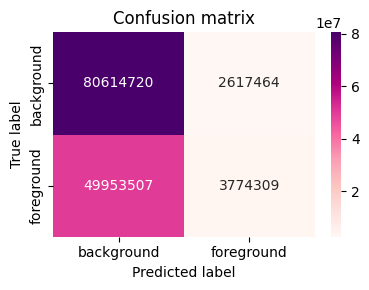

In [21]:
#report_1 = model_classification_report(model_1, test_loader_1, DEVICE, NUM_CLASES)
acc, rep, cm = model_segmentation_report(
    model_1_2, test_loader_1, DEVICE, NUM_CLASES, do_confusion_matrix=True, show_dice_loss=True
)

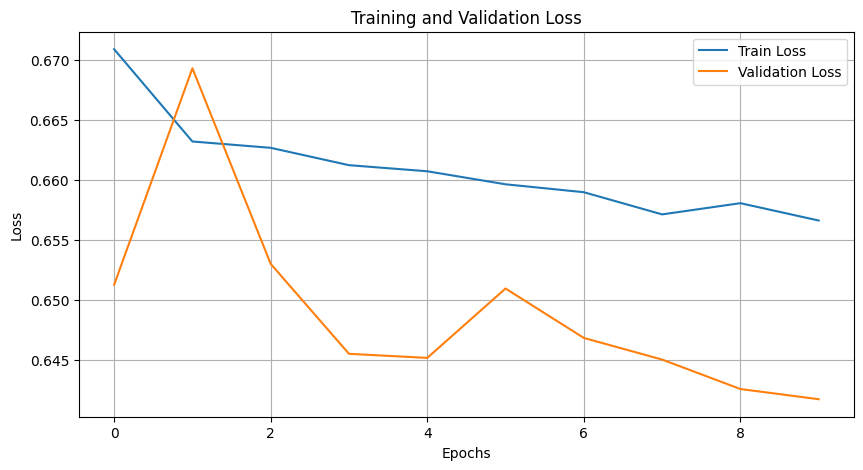

In [22]:
plot_training(epoch_train_errors_1_2, epoch_val_errors_1_2)

## Entrenando UNet con padding 1

La idea de esto es simplificar la arquitectura manteniendo el tamaño de las imagenes para mantener mas información de la imagen en cada capa y no tener que hacer un resize en la parte del decoder, pudiendo simplemente concatenar los feature maps.

In [39]:
train_loader_pad, val_loader_pad, test_loader_pad, kaggle_loader_pad = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=base_img_tf_byn,
                                                            train_transform_mask=base_mask_tf_byn,
                                                            val_transform_img=base_img_tf_byn,
                                                            val_transform_mask=base_mask_tf_byn)

In [140]:
unet_pad_1 = UNet(n_class=1, padding=1).to(DEVICE)
criterion_pad_1 = nn.BCEWithLogitsLoss()
optimizer_pad_1  = torch.optim.Adam(unet_pad_1.parameters(), lr=1e-5)

epoch_train_errors_pad_1, epoch_val_errors_pad_1 = train(unet_pad_1, optimizer_pad_1, criterion_pad_1,
                                                 train_loader_pad, val_loader_pad, DEVICE,
                                                 do_early_stopping=True, patience=15, epochs=100, log_every=10)

Epoch: 002 | Train Loss: 0.65953 | Val Loss: 0.62329
Epoch: 010 | Train Loss: 0.50128 | Val Loss: 0.45910
Epoch: 020 | Train Loss: 0.42229 | Val Loss: 0.39328
Epoch: 030 | Train Loss: 0.38674 | Val Loss: 0.36211
Epoch: 040 | Train Loss: 0.35059 | Val Loss: 0.33363
Epoch: 050 | Train Loss: 0.31471 | Val Loss: 0.32260
Epoch: 060 | Train Loss: 0.27657 | Val Loss: 0.31501
Epoch: 070 | Train Loss: 0.22550 | Val Loss: 0.32787
Detener entrenamiento en la época 73, la mejor pérdida fue 0.31364


Accuracy: 0.8695
Dice: 0.7995


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona        0.9         0.89         0.89       83232184.0             
persona          0.83         0.84         0.84       53727816.0             
accuracy                                   0.87                              
macro avg        0.86         0.86         0.86      136960000.0      0.8    
weighted avg     0.87         0.87         0.87      136960000.0      0.8    
1                                                                     0.8    



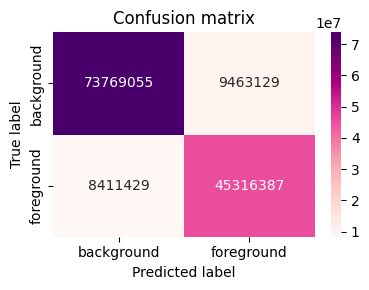

In [141]:
#report_1 = model_classification_report(model_1, test_loader_1, DEVICE, NUM_CLASES)
acc, rep, cm = model_segmentation_report(
    unet_pad_1, test_loader_pad, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

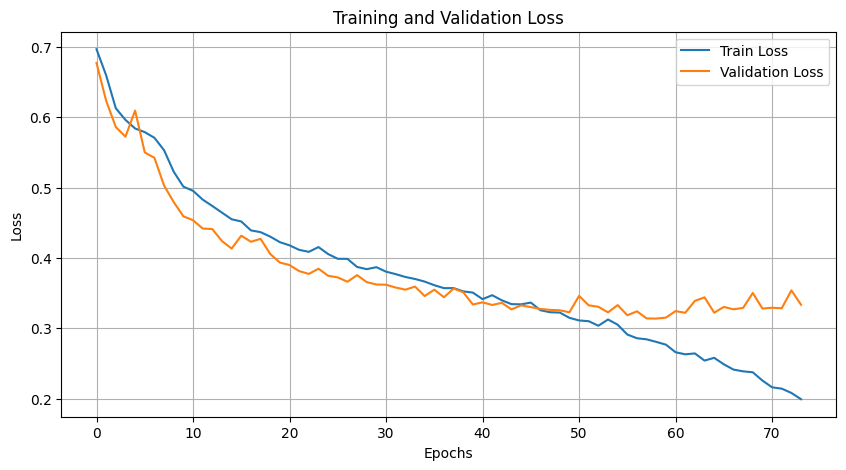

In [142]:
plot_training(epoch_train_errors_pad_1, epoch_val_errors_pad_1)

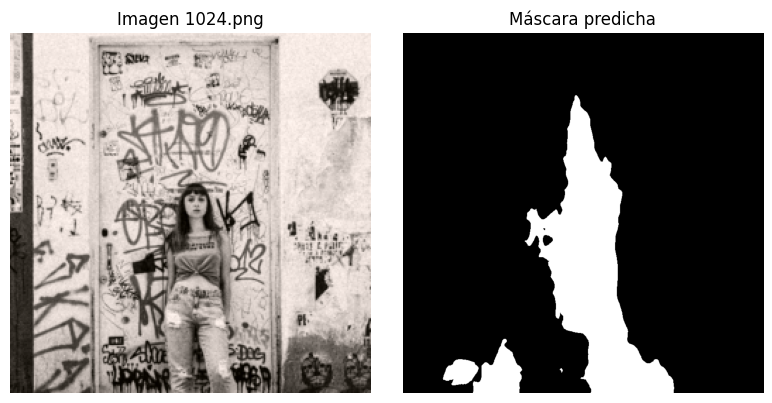

In [147]:
visualizar_test(unet_pad_1, kaggle_loader_pad, DEVICE)

In [148]:
train_loader_pad, val_loader_pad, test_loader_pad, kaggle_loader_pad = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=train_transform_img_simple,
                                                            train_transform_mask=train_transform_mask_simple,
                                                            val_transform_img=val_transform_img,
                                                            val_transform_mask=val_transform_mask)
predict_and_build_submission(unet_pad_1, DEVICE, kaggle_loader_pad, out_csv="unet_padding_1_submission")

submission guardado como: submissions/unet_padding_1_submission_16-11-2025_20:01.csv


(           id                                     encoded_pixels
 0    1024.png  71168 1 71965 7 72761 11 73559 13 74356 16 751...
 1    1025.png  672 129 1472 129 2270 131 3069 132 3868 133 46...
 2    1027.png  180714 23 181506 38 182300 50 183094 61 183888...
 3    1037.png  5747 14 6545 20 7343 25 8142 33 8209 28 8941 3...
 4    1038.png  27976 3 28774 7 29574 8 30374 9 31173 11 31973...
 ..        ...                                                ...
 529   971.png  103886 1 104682 9 105480 15 106278 20 107077 2...
 530   975.png  5032 8 5827 18 6624 23 7421 29 8218 33 8961 8 ...
 531   987.png  18879 4 19677 11 20476 15 21275 19 22076 19 22...
 532   995.png  344 143 1144 143 1942 147 2741 149 3540 151 43...
 533   999.png  190386 6 191182 13 191979 19 192776 25 193573 ...
 
 [534 rows x 2 columns],
 'submissions/unet_padding_1_submission_16-11-2025_20:01.csv')

### Otra prueba de la misma arquitectura pero con transforms corregidas, combined loss y learning rate mas grande

In [40]:
unet_pad_1_1 = UNet(n_class=1, padding=1).to(DEVICE)
criterion_pad_1_1 = combined_loss
optimizer_pad_1_1  = torch.optim.Adam(unet_pad_1_1.parameters(), lr=1e-4)

epoch_train_errors_pad_1_1, epoch_val_errors_pad_1_1 = train(unet_pad_1_1, optimizer_pad_1_1, criterion_pad_1_1,
                                                 train_loader_pad, val_loader_pad, DEVICE,
                                                 do_early_stopping=True, patience=10, epochs=100, log_every=5,
                                                checkpoint_path="models/unet_pad_1_1.pth", loss_ponderada=True)

Epoch: 002 | Train Loss: 0.47095 | Val Loss: 0.47347
Epoch: 005 | Train Loss: 0.36873 | Val Loss: 0.39898
Epoch: 010 | Train Loss: 0.25649 | Val Loss: 0.27531
Epoch: 015 | Train Loss: 0.16081 | Val Loss: 0.24208
Epoch: 020 | Train Loss: 0.06119 | Val Loss: 0.28227
Detener entrenamiento en la época 23, la mejor pérdida fue 0.23616


Accuracy: 0.8977
Dice: 0.8423


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.92         0.91         0.92       8522061.0              
persona          0.86         0.88         0.87       5502643.0              
accuracy                                    0.9                              
macro avg        0.89          0.9         0.89      14024704.0      0.84    
weighted avg      0.9          0.9          0.9      14024704.0      0.84    
1                                                                    0.84    



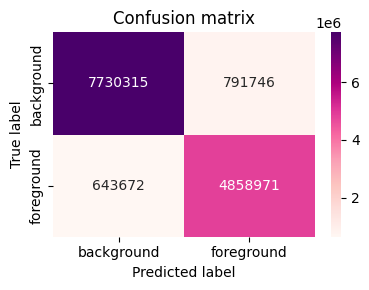

In [41]:
acc, rep, cm = model_segmentation_report(
    unet_pad_1_1, test_loader_pad, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

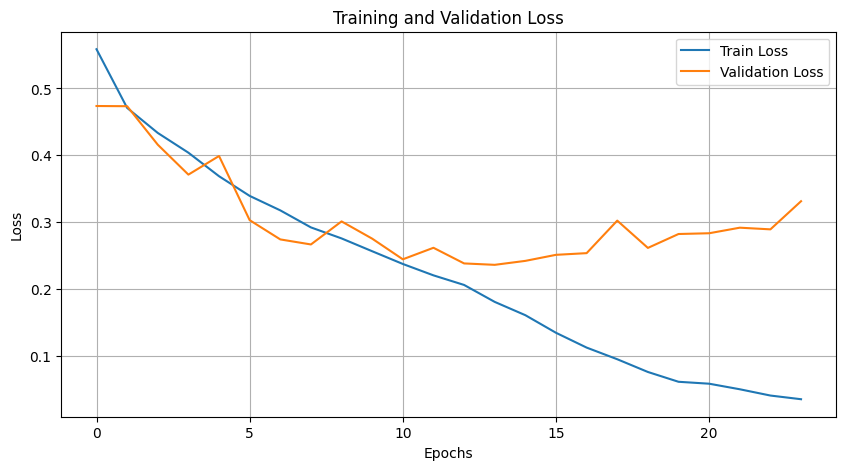

In [42]:
plot_training(epoch_train_errors_pad_1_1, epoch_val_errors_pad_1_1)

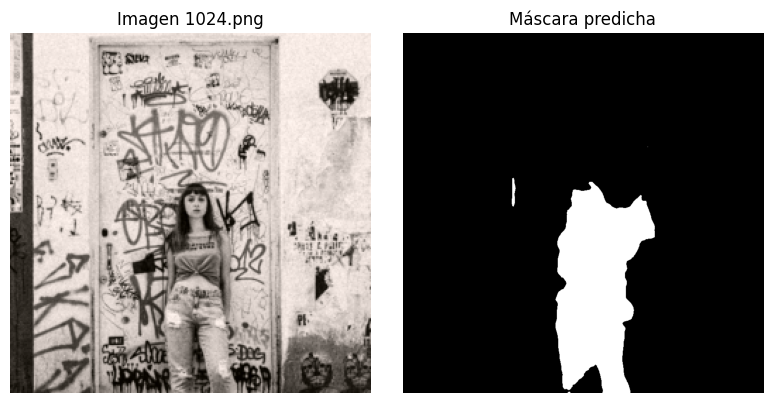

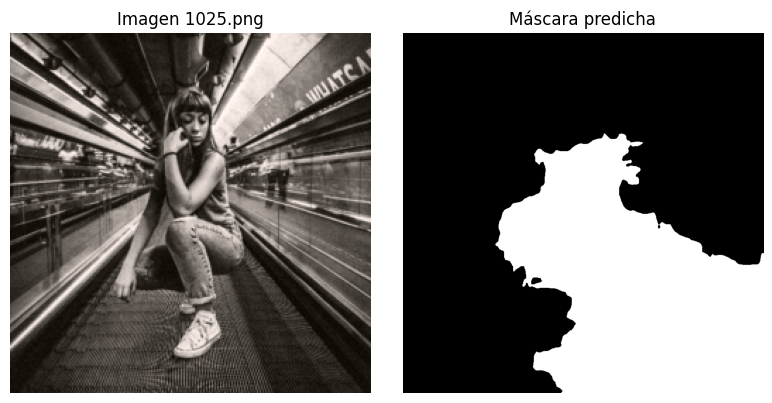

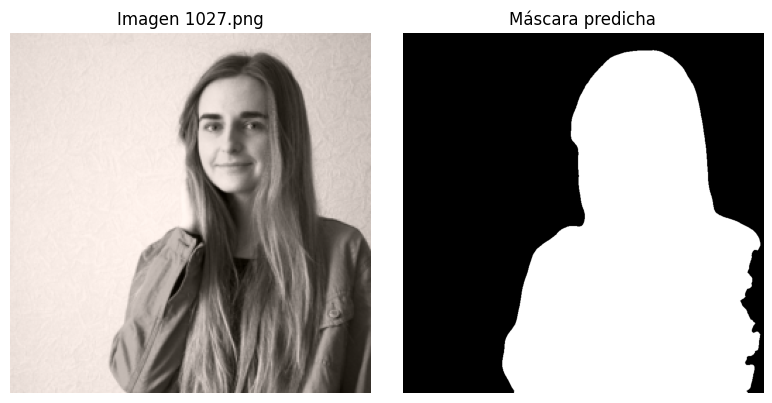

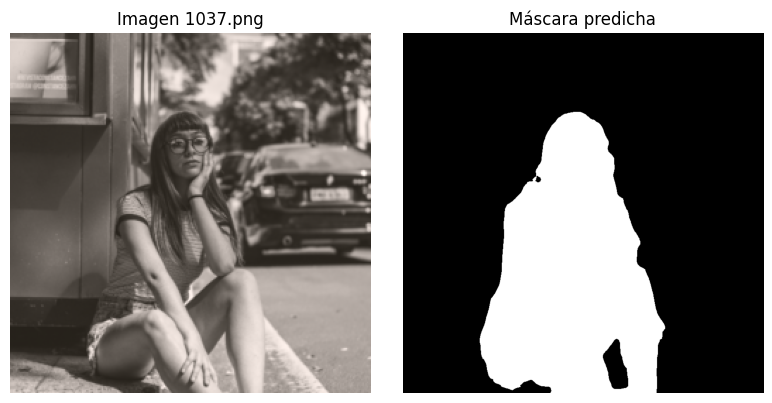

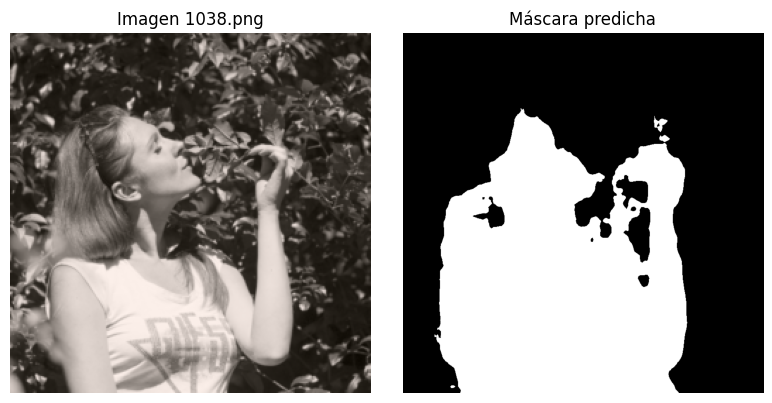

In [45]:
visualizar_test(unet_pad_1_1, kaggle_loader_pad, DEVICE)

In [47]:
_, _, _, kaggle_loader_pad = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=base_img_tf_byn,
                                                            train_transform_mask=base_mask_tf_byn,
                                                            val_transform_img=base_img_tf_byn,
                                                            val_transform_mask=base_mask_tf_byn)
predict_and_build_submission(unet_pad_1_1, DEVICE, kaggle_loader_pad, out_csv="unet_padding_1_1_submission")

submission guardado como: submissions/unet_padding_1_1_submission_19-11-2025_00:51.csv


(           id                                     encoded_pixels
 0    1024.png  193170 13 193925 62 194725 62 195524 64 196325...
 1    1025.png  163671 1 164470 3 165269 6 166068 7 166867 9 1...
 2    1027.png  176728 16 177522 26 178316 36 179112 42 179904...
 3    1037.png  136679 11 137474 20 138270 37 139067 49 139864...
 4    1038.png  55874 1 56671 6 57472 5 58273 4 59074 2 59873 ...
 ..        ...                                                ...
 529   971.png  51999 2 52799 2 53598 3 54397 4 55197 4 55997 ...
 530   975.png  593 9 1393 9 2193 10 2993 11 3793 12 4592 15 5...
 531   987.png  474 103 1274 103 2073 104 2872 106 3672 106 44...
 532   995.png  339 77 1139 77 1938 78 2737 79 3537 79 4336 80...
 533   999.png  169558 2 170354 14 171151 21 171949 26 172747 ...
 
 [534 rows x 2 columns],
 'submissions/unet_padding_1_1_submission_19-11-2025_00:51.csv')

## Entrenando UNet con padding 1 + RGB


In [145]:
train_loader_rgb, val_loader_rgb, test_loader_rgb, kaggle_loader_rgb = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

In [146]:
unet_rgb = UNet(n_class=1, n_channels=3, padding=1).to(DEVICE)
criterion_rgb = nn.BCEWithLogitsLoss()
optimizer_rgb  = torch.optim.Adam(unet_rgb.parameters(), lr=1e-5)
 
epoch_train_errors_rgb, epoch_val_errors_rgb = train(unet_rgb, optimizer_rgb, criterion_rgb,
                                                 train_loader_rgb, val_loader_rgb, DEVICE,
                                                 do_early_stopping=True, patience=15, epochs=300, log_every=20)

Epoch: 002 | Train Loss: 0.65893 | Val Loss: 0.62864
Epoch: 020 | Train Loss: 0.37553 | Val Loss: 0.37538
Epoch: 040 | Train Loss: 0.29874 | Val Loss: 0.34273
Epoch: 060 | Train Loss: 0.22116 | Val Loss: 0.34369
Detener entrenamiento en la época 66, la mejor pérdida fue 0.33036


Accuracy: 0.8711
Dice: 0.7945


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.88         0.91          0.9       83232184.0             
persona          0.85         0.81         0.83       53727816.0             
accuracy                                   0.87                              
macro avg        0.87         0.86         0.86      136960000.0     0.79    
weighted avg     0.87         0.87         0.87      136960000.0     0.79    
1                                                                    0.79    



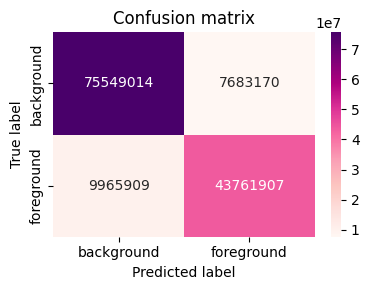

In [149]:
acc, rep, cm = model_segmentation_report(
    unet_rgb, test_loader_rgb, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

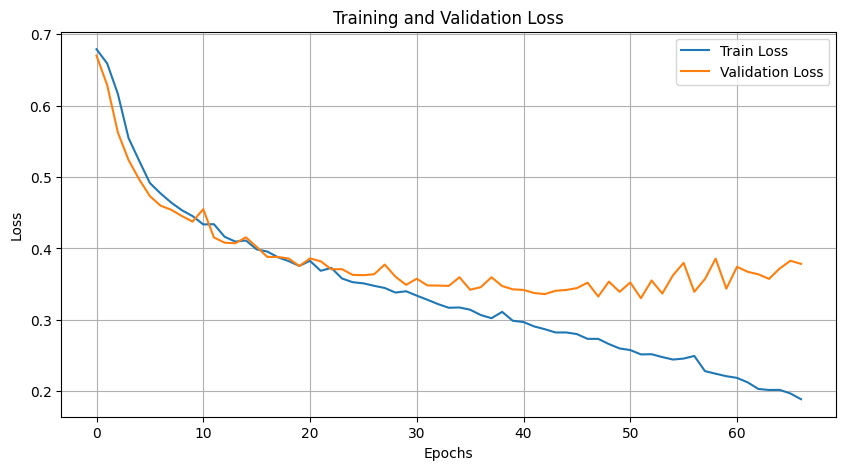

In [150]:
plot_training(epoch_train_errors_rgb, epoch_val_errors_rgb)

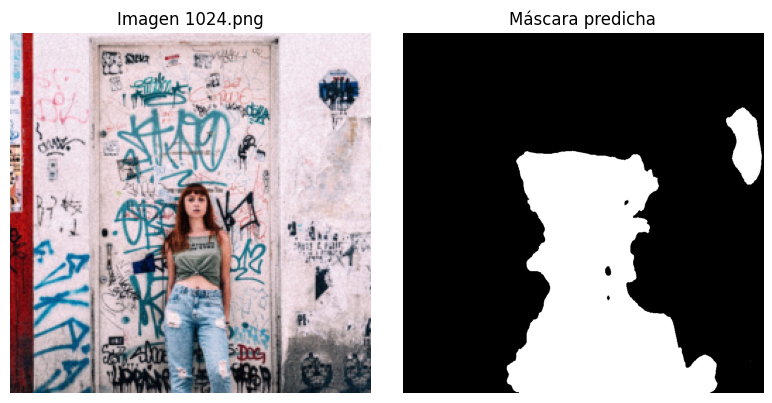

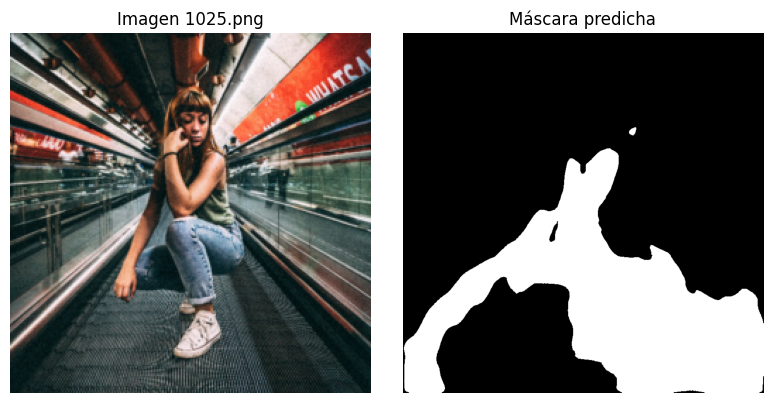

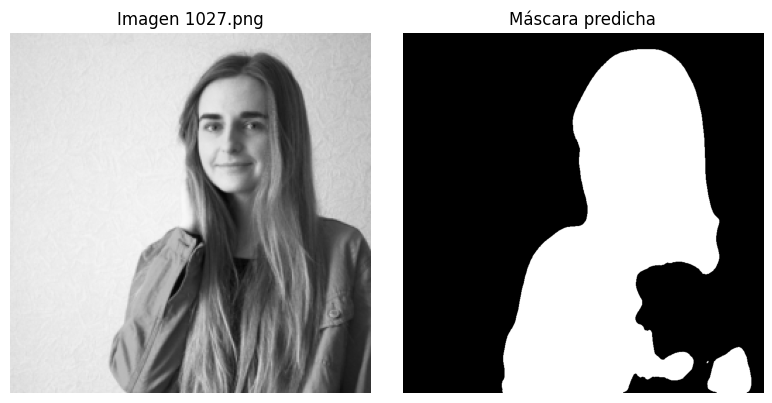

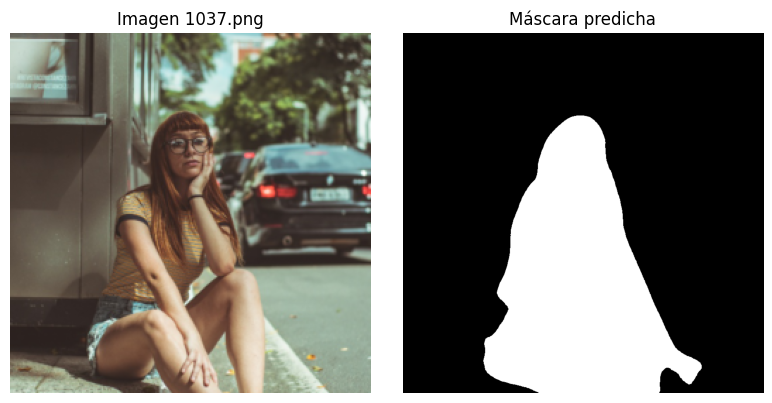

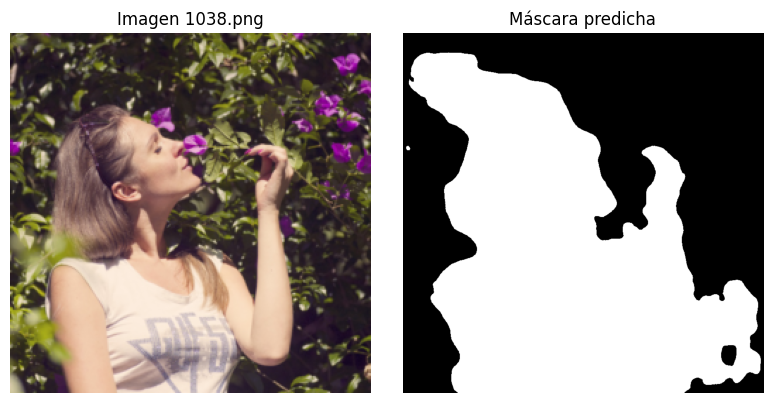

In [151]:
visualizar_test(unet_rgb, kaggle_loader_rgb, DEVICE)

In [152]:
train_loader_rgb, val_loader_rgb, test_loader_rgb, kaggle_loader_rgb = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)
predict_and_build_submission(unet_rgb, DEVICE, kaggle_loader_rgb, out_csv="unet_rgb_submission")

submission guardado como: submissions/unet_rgb_submission_16-11-2025_20:06.csv


(           id                                     encoded_pixels
 0    1024.png  184742 8 184772 4 185540 12 185568 11 186339 1...
 1    1025.png  2299 7 2374 1 3095 16 3136 55 3893 24 3926 69 ...
 2    1027.png  175979 10 176775 18 176794 4 177573 28 178317 ...
 3    1037.png  143127 5 143923 14 144689 6 144719 21 145485 1...
 4    1038.png  5855 5 6654 8 7454 9 8253 10 9053 10 9854 9 10...
 ..        ...                                                ...
 529   971.png  60780 10 61577 14 62376 16 63175 17 63974 19 6...
 530   975.png  7808 6 8600 18 9396 26 10194 30 10992 33 11791...
 531   987.png  2083 9 2880 15 3678 19 4477 21 5276 23 6076 24...
 532   995.png  384567 10 384580 1 385361 33 386155 45 386950 ...
 533   999.png  211095 19 211889 36 212686 46 213483 56 214279...
 
 [534 rows x 2 columns],
 'submissions/unet_rgb_submission_16-11-2025_20:06.csv')

### Ahora con batch_norm y dropout

In [24]:
train_loader_rgb_2, val_loader_rgb_2, test_loader_rgb_2, kaggle_loader_rgb_2 = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

In [25]:
unet_rgb_2 = UNet(n_class=1, n_channels=3, padding=1, use_bn=True, dropout=0.3).to(DEVICE)
criterion_rgb_2 = nn.BCEWithLogitsLoss()
optimizer_rgb_2 = torch.optim.Adam(unet_rgb_2.parameters(), lr=1e-5)
 
epoch_train_errors_rgb_2, epoch_val_errors_rgb_2 = train(unet_rgb_2, optimizer_rgb_2, criterion_rgb_2,
                                                 train_loader_rgb_2, val_loader_rgb_2, DEVICE,
                                                 do_early_stopping=True, patience=15, epochs=200, log_every=20)

Epoch: 002 | Train Loss: 0.68658 | Val Loss: 0.63494
Detener entrenamiento en la época 17, la mejor pérdida fue 0.62218


Accuracy: 0.6419
Dice: 0.1662


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.63          1.0         0.77       83232184.0             
persona          0.93         0.09         0.17       53727816.0             
accuracy                                   0.64                              
macro avg        0.78         0.54         0.47      136960000.0     0.17    
weighted avg     0.75         0.64         0.54      136960000.0     0.17    
1                                                                    0.17    



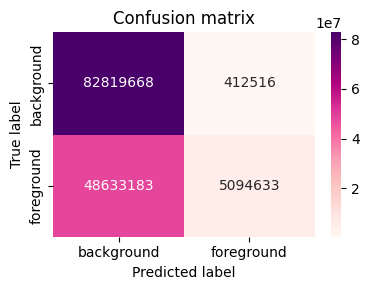

In [26]:
acc, rep, cm = model_segmentation_report(
    unet_rgb_2, test_loader_rgb_2, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

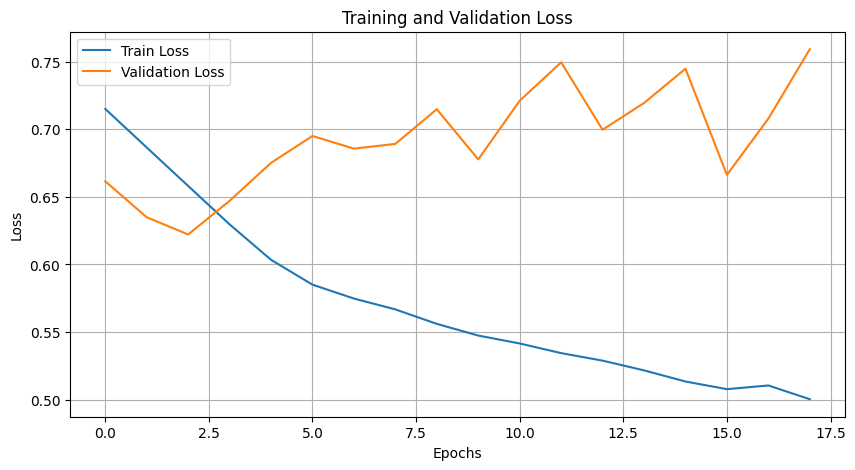

In [27]:
plot_training(epoch_train_errors_rgb_2, epoch_val_errors_rgb_2)

#### Observaciones

Es posible que los resultados no sean buenos al combinar batch norm y dropout, porque batch norm calcula estadisticas en el mini-batch y dropout hace que éstas varíen porque al estar apagando neuronas, la distribución que llega a la capa siguiente cambia y esto interfiere con lo que está haciendo batch-norm.

Batch norm actúa luego del dropout, por lo tanto, intenta calcular estadísticas a partir de un input que fue distorsionado a propósito y de forma aleatoria. Esto quiere decir que batch norm estaría haciendo cálculos sobre muestras que no representan a la distribución real de la capa y eso hace que en vez de estabilizar el proceso, introduzca ruido y perjudique el aprendizaje.

### Ahora solo con dropout

In [45]:
train_loader_rgb_drop, val_loader_rgb_drop, test_loader_rgb_drop, kaggle_loader_rgb_drop = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

In [46]:
unet_rgb_drop = UNet(n_class=1, n_channels=3, padding=1, use_bn=False, dropout=0.3).to(DEVICE)
criterion_rgb_drop = nn.BCEWithLogitsLoss()
optimizer_rgb_drop = torch.optim.Adam(unet_rgb_drop.parameters(), lr=1e-5)
 
epoch_train_errors_rgb_drop, epoch_val_errors_rgb_drop = train(unet_rgb_drop, optimizer_rgb_drop, criterion_rgb_drop,
                                                 train_loader_rgb_drop, val_loader_rgb_drop, DEVICE,
                                                 do_early_stopping=True, patience=20, epochs=400, log_every=10)

Epoch: 002 | Train Loss: 0.68119 | Val Loss: 0.65636
Epoch: 010 | Train Loss: 0.57290 | Val Loss: 0.53718
Epoch: 020 | Train Loss: 0.51103 | Val Loss: 0.46371
Epoch: 030 | Train Loss: 0.48433 | Val Loss: 0.44254
Epoch: 040 | Train Loss: 0.47200 | Val Loss: 0.43186
Epoch: 050 | Train Loss: 0.45746 | Val Loss: 0.41975
Epoch: 060 | Train Loss: 0.44997 | Val Loss: 0.40882
Epoch: 070 | Train Loss: 0.43655 | Val Loss: 0.40464
Epoch: 080 | Train Loss: 0.42682 | Val Loss: 0.39141
Epoch: 090 | Train Loss: 0.42102 | Val Loss: 0.38424
Epoch: 100 | Train Loss: 0.41597 | Val Loss: 0.38318
Epoch: 110 | Train Loss: 0.39998 | Val Loss: 0.37197
Epoch: 120 | Train Loss: 0.39035 | Val Loss: 0.36833
Epoch: 130 | Train Loss: 0.38254 | Val Loss: 0.36612
Epoch: 140 | Train Loss: 0.38043 | Val Loss: 0.35988
Epoch: 150 | Train Loss: 0.36926 | Val Loss: 0.35337
Epoch: 160 | Train Loss: 0.36495 | Val Loss: 0.35105
Epoch: 170 | Train Loss: 0.35606 | Val Loss: 0.37197
Epoch: 180 | Train Loss: 0.35270 | Val Loss: 0

Accuracy: 0.8600
Dice: 0.7987


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.92         0.84         0.88       83232184.0             
persona          0.78         0.89         0.83       53727816.0             
accuracy                                   0.86                              
macro avg        0.85         0.87         0.86      136960000.0      0.8    
weighted avg     0.87         0.86         0.86      136960000.0      0.8    
1                                                                     0.8    



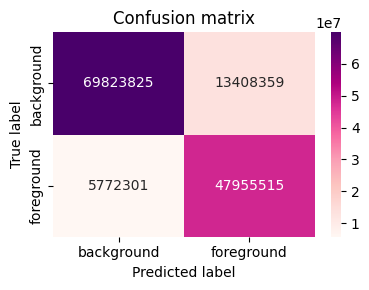

In [55]:
acc, rep, cm = model_segmentation_report(
    unet_rgb_drop, test_loader_rgb_drop, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

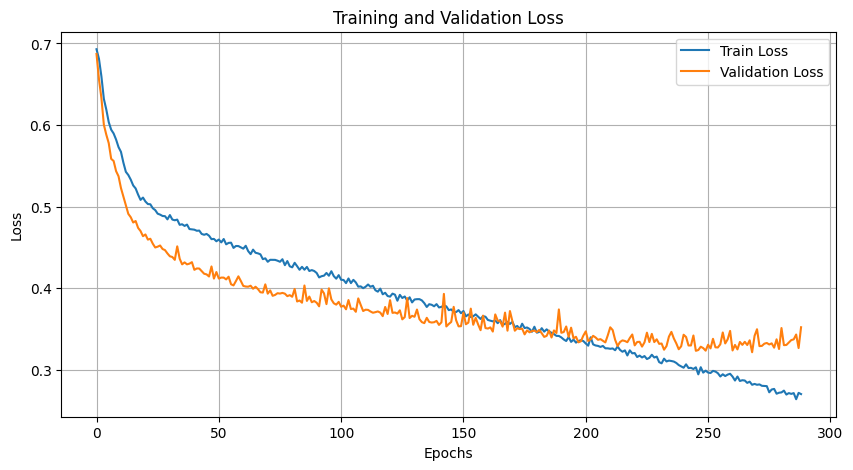

In [56]:
plot_training(epoch_train_errors_rgb_drop, epoch_val_errors_rgb_drop)

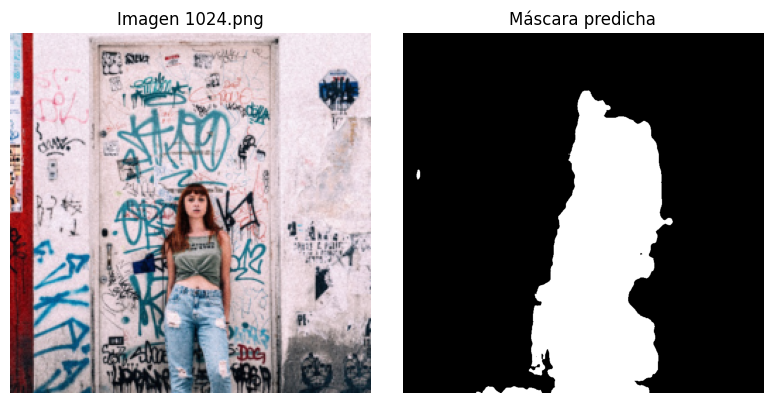

In [57]:
visualizar_test(unet_rgb_drop, kaggle_loader_rgb_drop, DEVICE)

In [58]:
_, _, _, kaggle_loader_rgb_drop = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

predict_and_build_submission(unet_rgb_drop, DEVICE, kaggle_loader_rgb_drop, out_csv="unet_rgb_drop_ubmission")

submission guardado como: submissions/unet_rgb_drop_ubmission_17-11-2025_21:17.csv


(           id                                     encoded_pixels
 0    1024.png  24315 8 25111 15 25907 21 26706 22 27506 21 28...
 1    1025.png  645 32 679 122 1445 32 1479 122 2245 156 3044 ...
 2    1027.png  175926 12 176717 26 177508 43 177599 2 178302 ...
 3    1037.png  131121 1 131912 25 132707 41 133504 47 134302 ...
 4    1038.png  20601 7 21399 10 22198 12 22998 12 23797 14 24...
 ..        ...                                                ...
 529   971.png  48796 5 49595 6 50393 8 51164 2 51190 11 51959...
 530   975.png  50196 5 50994 10 51792 14 52590 17 53389 19 54...
 531   987.png  482 28 524 215 1282 28 1324 215 2081 30 2123 2...
 532   995.png  2809 6 3608 9 4407 11 5207 11 6006 14 6805 16 ...
 533   999.png  72424 1 73222 5 74021 7 74823 5 75624 2 99577 ...
 
 [534 rows x 2 columns],
 'submissions/unet_rgb_drop_ubmission_17-11-2025_21:17.csv')

### Ahora solo con dropout y data augmentation

In [59]:
train_loader_rgb_3, val_loader_rgb_3, test_loader_rgb_3, kaggle_loader_rgb_3 = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb_augmented,
                                                            train_transform_mask=train_transform_mask_rgb_augmented,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

In [60]:
unet_rgb_3 = UNet(n_class=1, n_channels=3, padding=1, use_bn=False, dropout=0.3).to(DEVICE)
criterion_rgb_3 = nn.BCEWithLogitsLoss()
optimizer_rgb_3 = torch.optim.Adam(unet_rgb_3.parameters(), lr=1e-5)
 
epoch_train_errors_rgb_3, epoch_val_errors_rgb_3 = train(unet_rgb_3, optimizer_rgb_3, criterion_rgb_3,
                                                 train_loader_rgb_3, val_loader_rgb_3, DEVICE,
                                                 do_early_stopping=True, patience=20, epochs=300, log_every=10)

Epoch: 002 | Train Loss: 0.67652 | Val Loss: 0.66987
Epoch: 010 | Train Loss: 0.59937 | Val Loss: 0.58199
Epoch: 020 | Train Loss: 0.58271 | Val Loss: 0.55817
Epoch: 030 | Train Loss: 0.57246 | Val Loss: 0.54430
Epoch: 040 | Train Loss: 0.56750 | Val Loss: 0.54613
Epoch: 050 | Train Loss: 0.56239 | Val Loss: 0.52158
Epoch: 060 | Train Loss: 0.55443 | Val Loss: 0.50819
Epoch: 070 | Train Loss: 0.55103 | Val Loss: 0.50480
Epoch: 080 | Train Loss: 0.54800 | Val Loss: 0.50655
Epoch: 090 | Train Loss: 0.54315 | Val Loss: 0.48596
Epoch: 100 | Train Loss: 0.53340 | Val Loss: 0.47394
Epoch: 110 | Train Loss: 0.53645 | Val Loss: 0.47576
Epoch: 120 | Train Loss: 0.53601 | Val Loss: 0.47365
Epoch: 130 | Train Loss: 0.52779 | Val Loss: 0.45942
Epoch: 140 | Train Loss: 0.52524 | Val Loss: 0.45539
Epoch: 150 | Train Loss: 0.52119 | Val Loss: 0.45163
Epoch: 160 | Train Loss: 0.52250 | Val Loss: 0.44592
Epoch: 170 | Train Loss: 0.52219 | Val Loss: 0.44248
Epoch: 180 | Train Loss: 0.51498 | Val Loss: 0

Accuracy: 0.8267
Dice: 0.7440


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.87         0.84         0.85       8531764.0              
persona          0.76         0.81         0.79       5492940.0              
accuracy                                   0.83                              
macro avg        0.82         0.82         0.82      14024704.0      0.74    
weighted avg     0.83         0.83         0.83      14024704.0      0.74    
1                                                                    0.74    



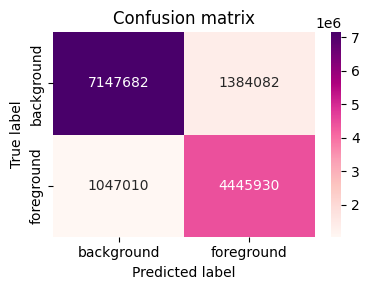

In [78]:
acc, rep, cm = model_segmentation_report(
    unet_rgb_3, test_loader_rgb_3, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

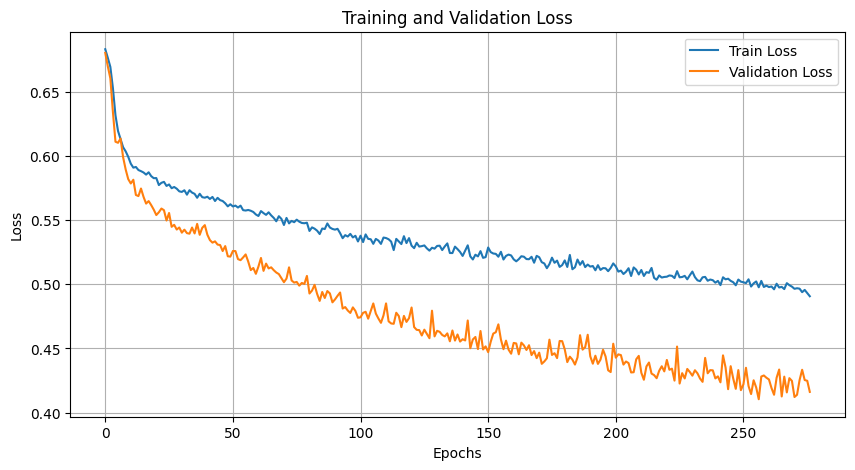

In [67]:
plot_training(epoch_train_errors_rgb_3, epoch_val_errors_rgb_3)

In [44]:
def denormalize(img, mean=MEAN_RGB, std=STD_RGB):
    """
    img: tensor (C,H,W) normalizado
    devuelve tensor (C,H,W) en [0,1] aprox
    """
    mean = torch.tensor(mean).view(-1, 1, 1)
    std  = torch.tensor(std).view(-1, 1, 1)
    return img * std + mean
    
@torch.no_grad()
def visualizar_test(model, loader, device, n=5, threshold=0.5):
    model.eval()
    imgs, names = next(iter(loader))      # aquí el loader da (x, name)
    imgs = imgs.to(device)

    logits = model(imgs)
    logits = match_output_to_dim(logits)  # misma función que en utils.py
    probs  = torch.sigmoid(logits)
    preds  = (probs > threshold).float()

    B = imgs.size(0)
    n = min(n, B)

    for i in range(n):
        img_vis = denormalize(imgs[i].cpu()).clamp(0,1).permute(1,2,0)
        pred    = preds[i].cpu().squeeze()

        fig, axs = plt.subplots(1, 2, figsize=(8, 4))
        axs[0].imshow(img_vis)
        axs[0].set_title(f"Imagen {names[i]}")
        axs[0].axis("off")

        axs[1].imshow(pred, cmap="gray")
        axs[1].set_title("Máscara predicha")
        axs[1].axis("off")
        plt.tight_layout()
        plt.show()



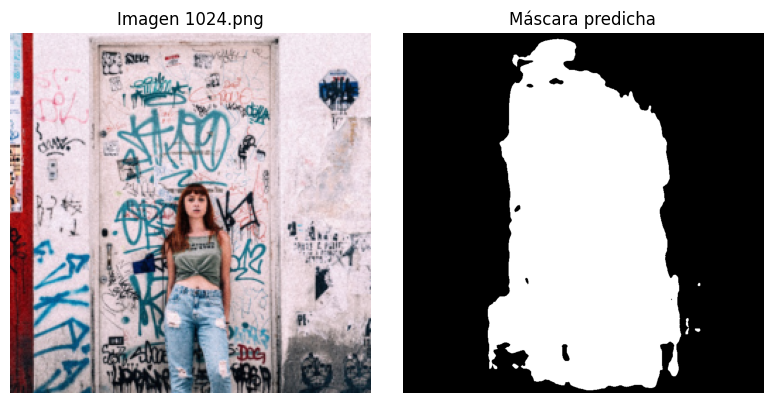

In [69]:
visualizar_test(unet_rgb_3, kaggle_loader_rgb_3, DEVICE)

In [70]:
_, _, _, kaggle_loader_rgb_3 = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

predict_and_build_submission(unet_rgb_3, DEVICE, kaggle_loader_rgb_3, out_csv="unet_rgb_s3_ubmission")

submission guardado como: submissions/unet_rgb_s3_ubmission_18-11-2025_01:01.csv


(           id                                     encoded_pixels
 0    1024.png  151015 17 151062 17 151811 27 151857 32 151915...
 1    1025.png  51046 19 51844 23 51888 9 52642 27 52685 15 53...
 2    1027.png  167146 1 167941 11 168738 18 169534 27 170329 ...
 3    1037.png  139799 2 140595 19 141387 30 142184 42 142982 ...
 4    1038.png  62969 6 62996 2 63765 13 63794 7 64559 26 6459...
 ..        ...                                                ...
 529   971.png  99894 6 100693 9 101492 13 102291 17 103091 21...
 530   975.png  69384 15 70181 20 70978 24 71774 29 72572 32 7...
 531   987.png  70970 5 71768 8 72566 11 73358 19 74157 21 749...
 532   995.png  169299 8 170095 33 170892 41 171689 47 171776 ...
 533   999.png  106346 5 107143 17 107940 24 108738 29 109536 ...
 
 [534 rows x 2 columns],
 'submissions/unet_rgb_s3_ubmission_18-11-2025_01:01.csv')

#### Observaciones

El resultado al aplicar nuevas transforms fue peor. PERO esto puede ser porque NO se aplicaron las mismas transforms a las mascaras... solo a las imagenes.

Esta prueba fue hecha con:

train_transform_img_rgb_augmented = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE), interpolation=T.InterpolationMode.BILINEAR),
        
        # Augmentation
        T.RandomHorizontalFlip(p=0.5), # Espejar (Flip)
        T.RandomRotation(degrees=(-10, 10)), # Rotar la imagen
        T.RandomCrop(
            size=(IMG_SIZE, IMG_SIZE),
            padding=10, # Pequeño padding para permitir el crop aleatorio
            padding_mode='reflect'
        ), # Zoom/Crop con padding
        
        # Otros útiles para segmentación (opcional, probar):
        # T.ColorJitter(brightness=0.2, contrast=0.2), # Variación de color (solo para RGB)
        # T.GaussianBlur(kernel_size=5, sigma=(0.1, 2.0), p=0.2), # Desenfoque (si el entorno lo requiere)

        T.ToDtype(torch.float32, scale=True),
        T.Normalize(mean=MEAN_RGB, std=STD_RGB),
    ]
)

train_transform_mask_rgb = None


val_transform_img_rgb = T.Compose(
    [
        T.ToImage(),
        T.Resize((IMG_SIZE, IMG_SIZE)),
        T.ToDtype(torch.float32, scale=True),        
        T.Normalize(mean=MEAN_RGB, std=STD_RGB),
    ]
)


val_transform_mask_rgb = None

## Entrenando UNet con padding 1 + ByN usando Dice + BCE para el cálculo de la función de pérdida.


In [115]:
train_loader_dice, val_loader_dice, test_loader_dice, kaggle_loader_dice = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=False,
                                                            train_transform_img=train_transform_img_simple,
                                                            train_transform_mask=train_transform_mask_simple,
                                                            val_transform_img=val_transform_img,
                                                            val_transform_mask=val_transform_mask)

In [117]:
unet_dice = UNet(n_class=1, padding=1).to(DEVICE)
criterion_dice = combined_loss
optimizer_dice  = torch.optim.Adam(unet_dice.parameters(), lr=1e-3)

epoch_train_errors_dice, epoch_val_errors_dice = train(unet_dice, optimizer_dice, criterion_dice,
                                                 train_loader_dice, val_loader_dice, DEVICE,
                                                 do_early_stopping=True, patience=20, epochs=300, log_every=10)

Epoch: 002 | Train Loss: 0.80819 | Val Loss: 0.65487
Epoch: 010 | Train Loss: 0.56793 | Val Loss: 0.55480
Epoch: 020 | Train Loss: 2.48733 | Val Loss: 0.66858
Epoch: 030 | Train Loss: 0.57444 | Val Loss: 0.54144
Detener entrenamiento en la época 37, la mejor pérdida fue 0.46443


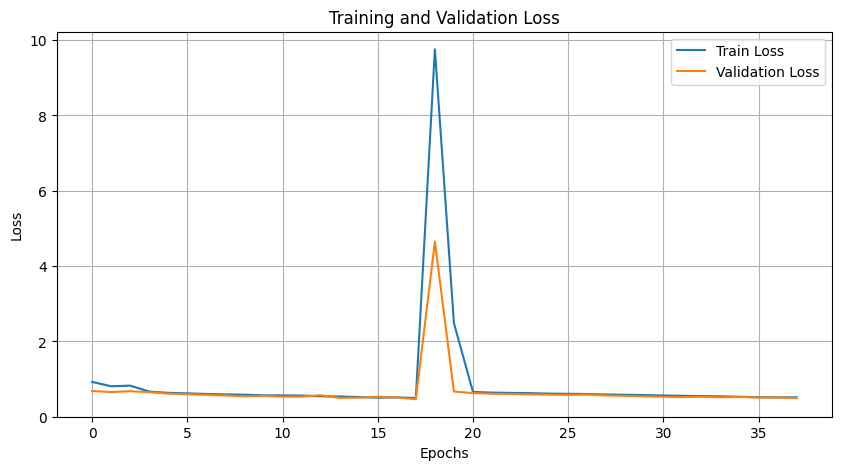

In [118]:
plot_training(epoch_train_errors_dice, epoch_val_errors_dice)

Accuracy: 0.7496
Dice: 0.6764


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.83         0.74         0.78       83232184.0             
persona          0.65         0.77         0.71       53727816.0             
accuracy                                   0.75                              
macro avg        0.74         0.75         0.74      136960000.0     0.68    
weighted avg     0.76         0.75         0.75      136960000.0     0.68    
1                                                                    0.68    



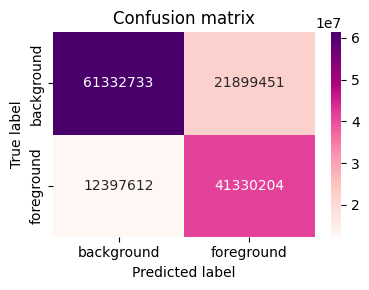

In [119]:
acc, rep, cm = model_segmentation_report(
    unet_dice, test_loader_dice, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

## Entrenando UNet con padding 1 + RGB + Dropout usando Dice + BCE para el cálculo de la función de pérdida.

In [41]:
train_loader_dice_rgb, val_loader_dice_rgb, test_loader_dice_rgb, kaggle_loader_dice_rgb = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

In [25]:
unet_rgb_dice = UNet(n_class=1, n_channels=3, padding=1, use_bn=False, dropout=0.3).to(DEVICE)
criterion_rgb_dice = combined_loss
optimizer_rgb_dice = torch.optim.Adam(unet_rgb_dice.parameters(), lr=1e-5)
 
epoch_train_errors_rgb_dice, epoch_val_errors_rgb_dice = train(unet_rgb_dice, optimizer_rgb_dice, criterion_rgb_dice,
                                                 train_loader_dice_rgb, val_loader_dice_rgb, DEVICE,
                                                 do_early_stopping=True, patience=20, epochs=400, log_every=5)

Epoch: 002 | Train Loss: 0.68599 | Val Loss: 0.68108
Epoch: 005 | Train Loss: 0.62840 | Val Loss: 0.59163
Epoch: 010 | Train Loss: 0.58043 | Val Loss: 0.55164
Epoch: 015 | Train Loss: 0.54488 | Val Loss: 0.51525
Epoch: 020 | Train Loss: 0.51421 | Val Loss: 0.48697
Epoch: 025 | Train Loss: 0.49806 | Val Loss: 0.46185
Epoch: 030 | Train Loss: 0.48538 | Val Loss: 0.44635
Epoch: 035 | Train Loss: 0.47627 | Val Loss: 0.43390
Epoch: 040 | Train Loss: 0.46709 | Val Loss: 0.43113
Epoch: 045 | Train Loss: 0.45848 | Val Loss: 0.41506
Epoch: 050 | Train Loss: 0.44819 | Val Loss: 0.40787
Epoch: 055 | Train Loss: 0.43772 | Val Loss: 0.39873
Epoch: 060 | Train Loss: 0.42813 | Val Loss: 0.39990
Epoch: 065 | Train Loss: 0.42120 | Val Loss: 0.39120
Epoch: 070 | Train Loss: 0.41591 | Val Loss: 0.38726
Epoch: 075 | Train Loss: 0.41263 | Val Loss: 0.37731
Epoch: 080 | Train Loss: 0.40076 | Val Loss: 0.38099
Epoch: 085 | Train Loss: 0.39571 | Val Loss: 0.37616
Epoch: 090 | Train Loss: 0.39549 | Val Loss: 0

Accuracy: 0.8700
Dice: 0.8096


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.94         0.84         0.89       83232184.0             
persona          0.79         0.92         0.85       53727816.0             
accuracy                                   0.87                              
macro avg        0.86         0.88         0.87      136960000.0     0.81    
weighted avg     0.88         0.87         0.87      136960000.0     0.81    
1                                                                    0.81    



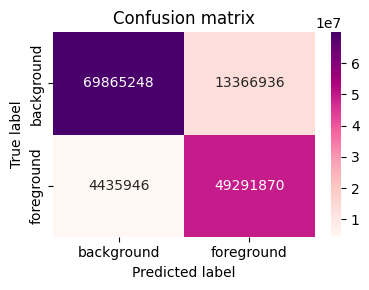

In [29]:
acc, rep, cm = model_segmentation_report(
    unet_rgb_dice, test_loader_dice_rgb, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

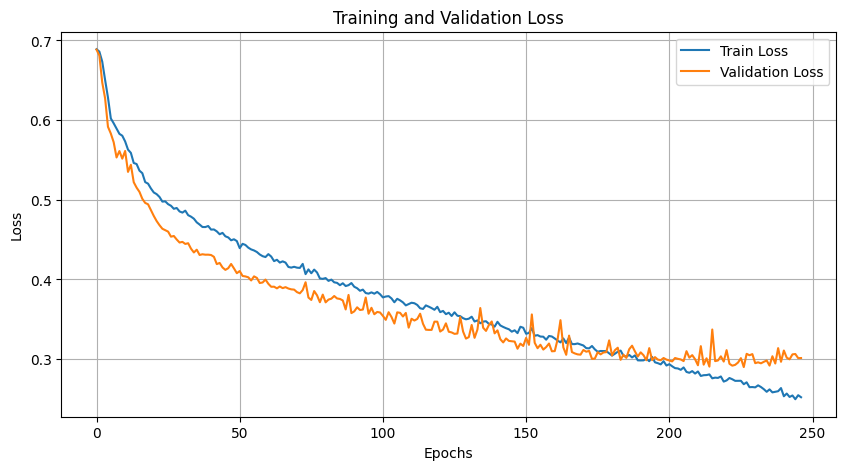

In [30]:
plot_training(epoch_train_errors_rgb_dice, epoch_val_errors_rgb_dice)

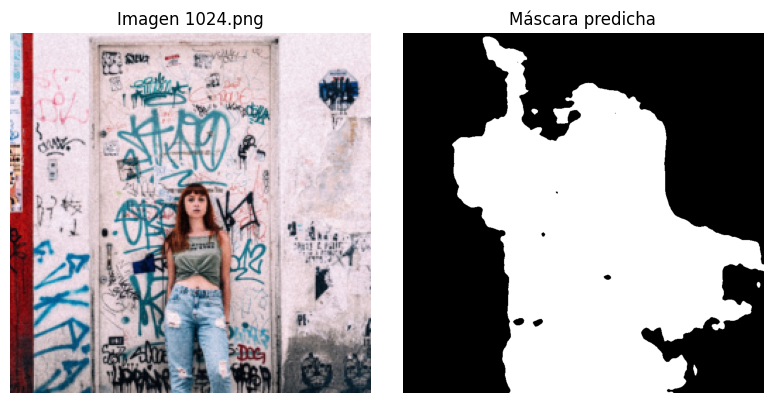

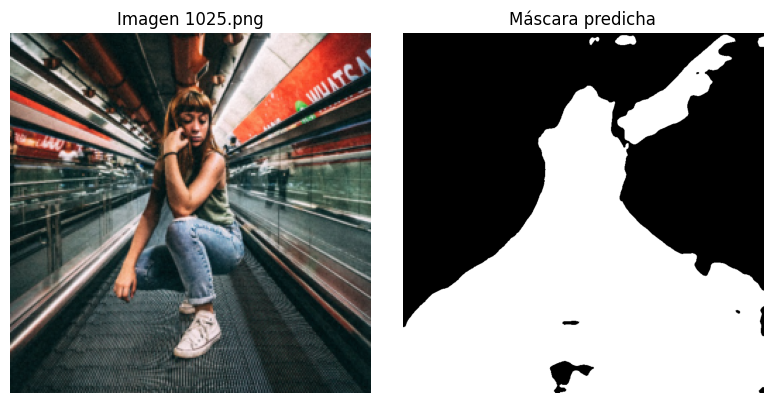

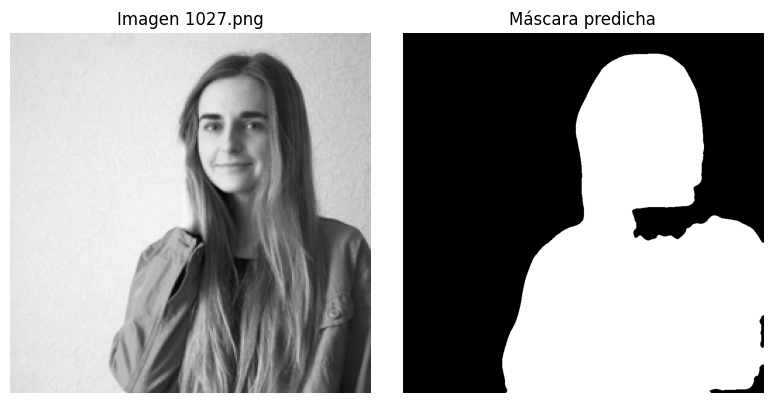

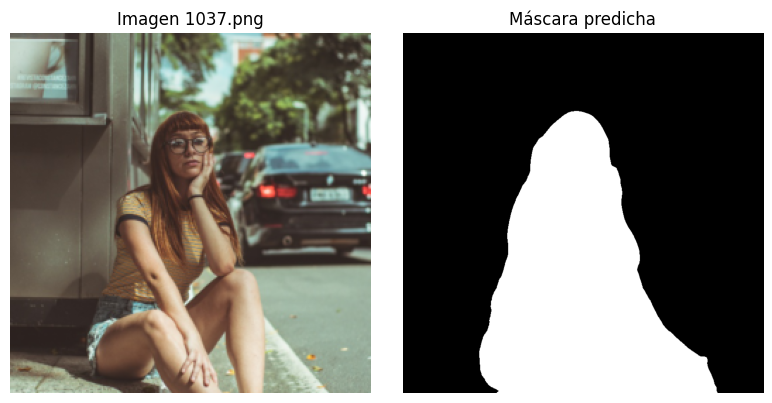

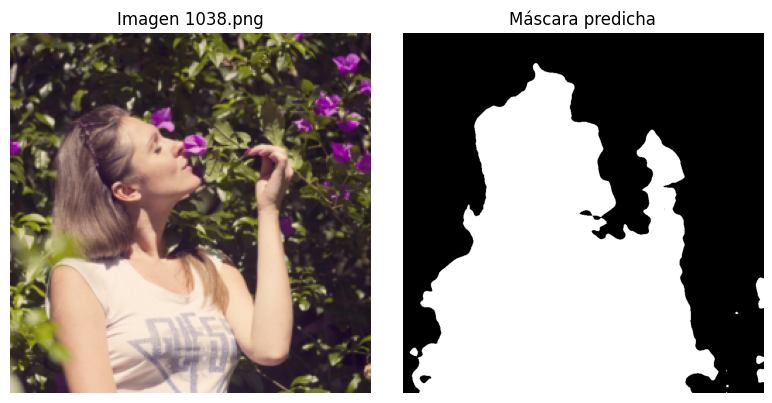

In [36]:
visualizar_test(unet_rgb_dice, kaggle_loader_dice_rgb, DEVICE)

In [39]:
train_loader_dice_rgb, val_loader_dice_rgb, test_loader_dice_rgb, kaggle_loader_dice_rgb = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb,
                                                            train_transform_mask=train_transform_mask_rgb,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

predict_and_build_submission(unet_rgb_dice, DEVICE, kaggle_loader_dice_rgb, out_csv="unet_rgb_dice_submission")

submission guardado como: submissions/unet_rgb_dice_submission_17-11-2025_11:41.csv


(           id                                     encoded_pixels
 0    1024.png  87449 4 88248 6 89047 8 89846 11 89900 15 9064...
 1    1025.png  655 146 1455 146 2255 146 3054 147 3854 147 46...
 2    1027.png  176724 22 177519 32 178314 42 179110 51 179907...
 3    1037.png  135907 16 136702 36 137500 51 138295 59 139091...
 4    1038.png  12709 4 13508 6 14307 7 15106 9 15904 12 16703...
 ..        ...                                                ...
 529   971.png  15189 2 15986 9 15999 2 16784 17 17582 19 1838...
 530   975.png  589 39 1389 39 2188 40 2988 40 3787 41 4587 42...
 531   987.png  184 94 471 118 622 20 645 71 984 94 1271 118 1...
 532   995.png  399 33 1199 33 1999 33 2799 33 3599 33 4399 34...
 533   999.png  209493 23 210284 41 211078 51 211871 63 212669...
 
 [534 rows x 2 columns],
 'submissions/unet_rgb_dice_submission_17-11-2025_11:41.csv')

#### Observaciones

Esto fue entrenado con batch size de 16 y las transforms "viejas", previas al cambio de 17/11. Abajo voy a volver a repetir este pero con batch size de 8, menos epocas, y las nuevas transforms.

## Entrenando UNet con padding 1 + RGB + Dropout usando Dice + BCE para el cálculo de la función de pérdida + nuevas transforms

In [35]:
train_loader_dice_rgb_2, val_loader_dice_rgb_2, test_loader_dice_rgb_2, _ = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb_augmented,
                                                            train_transform_mask=train_transform_mask_rgb_augmented,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

In [36]:
unet_rgb_dice_2 = UNet(n_class=1, n_channels=3, padding=1, use_bn=False, dropout=0.3).to(DEVICE)
criterion_rgb_dice_2 = combined_loss
optimizer_rgb_dice_2 = torch.optim.Adam(unet_rgb_dice_2.parameters(), lr=1e-5)
 
epoch_train_errors_rgb_dice_2, epoch_val_errors_rgb_dice_2 = train(unet_rgb_dice_2, optimizer_rgb_dice_2, criterion_rgb_dice_2,
                                                 train_loader_dice_rgb_2, val_loader_dice_rgb_2, DEVICE,
                                                 do_early_stopping=True, patience=20, epochs=100, log_every=5)

Epoch: 002 | Train Loss: 0.69074 | Val Loss: 0.68312
Epoch: 005 | Train Loss: 0.61469 | Val Loss: 0.58358
Epoch: 010 | Train Loss: 0.59593 | Val Loss: 0.56715
Epoch: 015 | Train Loss: 0.58829 | Val Loss: 0.55349
Epoch: 020 | Train Loss: 0.58089 | Val Loss: 0.54538
Epoch: 025 | Train Loss: 0.57444 | Val Loss: 0.52401
Epoch: 030 | Train Loss: 0.57062 | Val Loss: 0.52826
Epoch: 035 | Train Loss: 0.56581 | Val Loss: 0.50461
Epoch: 040 | Train Loss: 0.55887 | Val Loss: 0.50247
Epoch: 045 | Train Loss: 0.55920 | Val Loss: 0.50108
Epoch: 050 | Train Loss: 0.55388 | Val Loss: 0.49809
Epoch: 055 | Train Loss: 0.55129 | Val Loss: 0.48362
Epoch: 060 | Train Loss: 0.55400 | Val Loss: 0.48387
Epoch: 065 | Train Loss: 0.54702 | Val Loss: 0.47772
Epoch: 070 | Train Loss: 0.54689 | Val Loss: 0.47145
Epoch: 075 | Train Loss: 0.53865 | Val Loss: 0.46828
Epoch: 080 | Train Loss: 0.53435 | Val Loss: 0.46328
Epoch: 085 | Train Loss: 0.53234 | Val Loss: 0.46565
Epoch: 090 | Train Loss: 0.53563 | Val Loss: 0

Accuracy: 0.7845
Dice: 0.7145


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.88         0.75         0.81       8531764.0              
persona          0.68         0.84         0.75       5492940.0              
accuracy                                   0.78                              
macro avg        0.78         0.79         0.78      14024704.0      0.71    
weighted avg      0.8         0.78         0.79      14024704.0      0.71    
1                                                                    0.71    



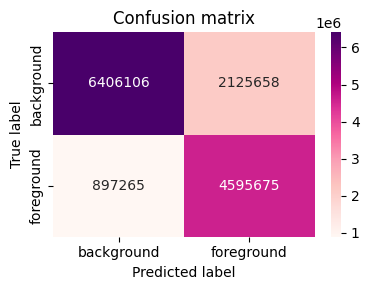

In [40]:
acc, rep, cm = model_segmentation_report(
    unet_rgb_dice_2, test_loader_dice_rgb_2, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

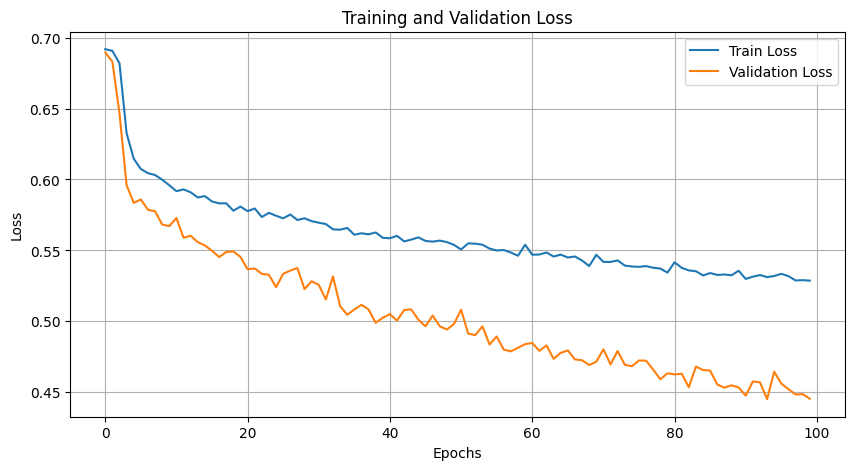

In [41]:
plot_training(epoch_train_errors_rgb_dice_2, epoch_val_errors_rgb_dice_2)

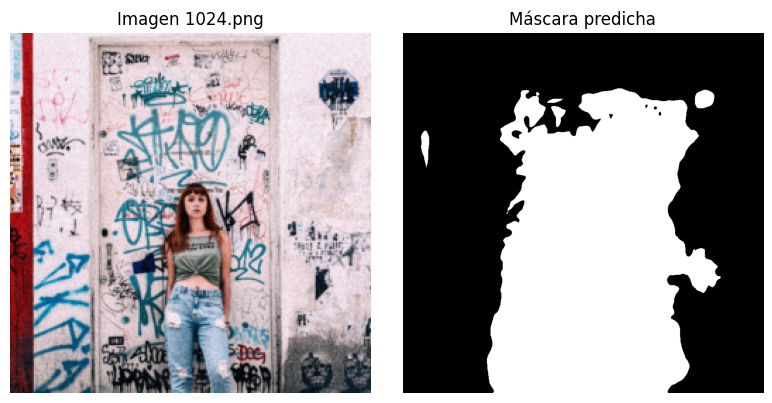

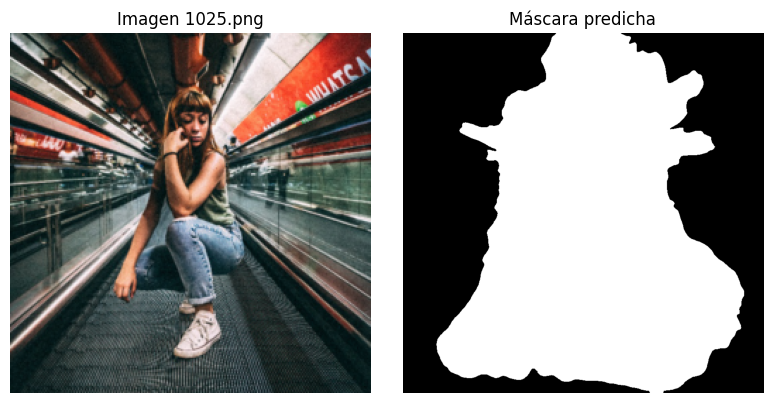

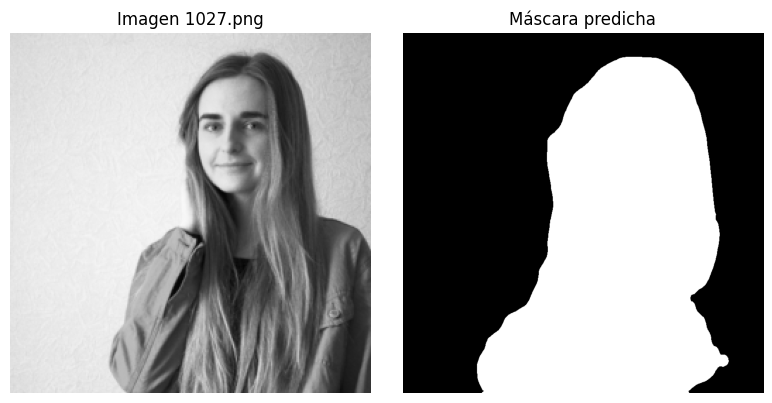

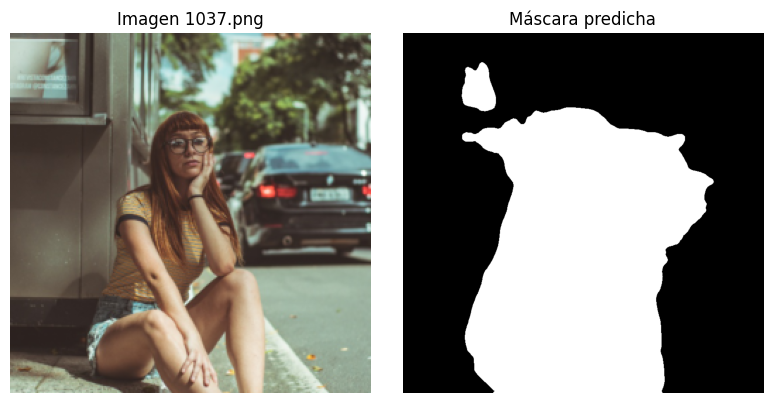

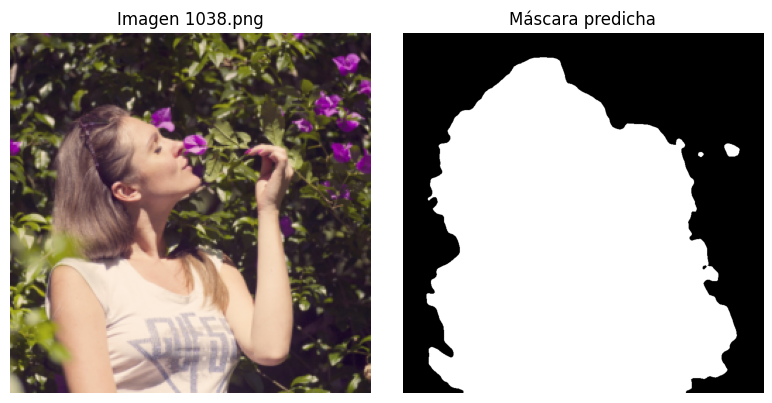

In [45]:
_, _, _, kaggle_loader_dice_rgb_2 = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb_augmented,
                                                            train_transform_mask=train_transform_mask_rgb_augmented,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

visualizar_test(unet_rgb_dice_2, kaggle_loader_dice_rgb_2, DEVICE)

In [ ]:
_, _, _, kaggle_loader_dice_rgb_2 = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=train_transform_img_rgb_augmented,
                                                            train_transform_mask=train_transform_mask_rgb_augmented,
                                                            val_transform_img=val_transform_img_rgb,
                                                            val_transform_mask=val_transform_mask_rgb)

predict_and_build_submission(unet_rgb_dice_2, DEVICE, kaggle_loader_dice_rgb_2, out_csv="unet_rgb_dice_2_submission")

## Entrenando UNetAttention con padding 1 + RGB + Dropout usando Dice + BCE para el cálculo de la función de pérdida + Data aug

In [81]:
joint_train_aug = JointSegAugment(do_flip=True, do_rotate=True, max_angle=10)
joint_val_aug   = None
train_loader_att, val_loader_dice_att, test_loader_dice_tatt, kaggle_loader_att = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=base_img_tf,
                                                            train_transform_mask=base_mask_tf,
                                                            val_transform_img=base_img_tf,
                                                            val_transform_mask=val_transform_mask_rgb,
                                                            joint_transform_train=joint_train_aug,
                                                            joint_transform_val=joint_val_aug)

In [82]:
unet_att = UNetAttention(
    n_class=1,
    n_channels=3,    
    padding=1,
    use_bn=False,    
    dropout=0.3,
    use_attention=True
).to(DEVICE)
criterion_att = combined_loss
optimizer_att = torch.optim.Adam(unet_att.parameters(), lr=1e-5)
 
epoch_train_errors_att, epoch_val_errors_att = train(unet_att, optimizer_att, criterion_att,
                                                 train_loader_att, val_loader_dice_att, DEVICE,
                                                 do_early_stopping=True, patience=10, epochs=200, log_every=5)

Epoch: 002 | Train Loss: 0.67573 | Val Loss: 0.65192
Epoch: 005 | Train Loss: 0.60133 | Val Loss: 0.57451
Epoch: 010 | Train Loss: 0.55756 | Val Loss: 0.51720
Epoch: 015 | Train Loss: 0.52057 | Val Loss: 0.48381
Epoch: 020 | Train Loss: 0.49513 | Val Loss: 0.45903
Epoch: 025 | Train Loss: 0.48300 | Val Loss: 0.44992
Epoch: 030 | Train Loss: 0.46838 | Val Loss: 0.43345
Epoch: 035 | Train Loss: 0.46048 | Val Loss: 0.41831
Epoch: 040 | Train Loss: 0.45203 | Val Loss: 0.40633
Epoch: 045 | Train Loss: 0.44163 | Val Loss: 0.40507
Epoch: 050 | Train Loss: 0.42856 | Val Loss: 0.38997
Epoch: 055 | Train Loss: 0.42171 | Val Loss: 0.38061
Epoch: 060 | Train Loss: 0.41483 | Val Loss: 0.37429
Epoch: 065 | Train Loss: 0.40928 | Val Loss: 0.36885
Epoch: 070 | Train Loss: 0.39582 | Val Loss: 0.35923
Epoch: 075 | Train Loss: 0.38660 | Val Loss: 0.36620
Epoch: 080 | Train Loss: 0.38385 | Val Loss: 0.35518
Epoch: 085 | Train Loss: 0.37687 | Val Loss: 0.34685
Epoch: 090 | Train Loss: 0.37065 | Val Loss: 0

Accuracy: 0.8742
Dice: 0.8184


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.93         0.86         0.89       8531764.0              
persona           0.8          0.9         0.85       5492940.0              
accuracy                                   0.87                              
macro avg        0.87         0.88         0.87      14024704.0      0.82    
weighted avg     0.88         0.87         0.88      14024704.0      0.82    
1                                                                    0.82    



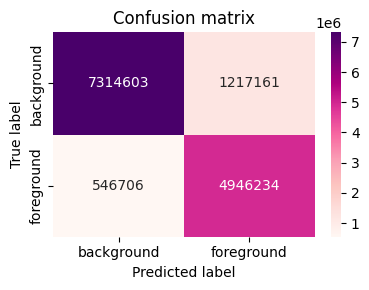

In [105]:
acc, rep, cm = model_segmentation_report(
    unet_att, test_loader_dice_tatt, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

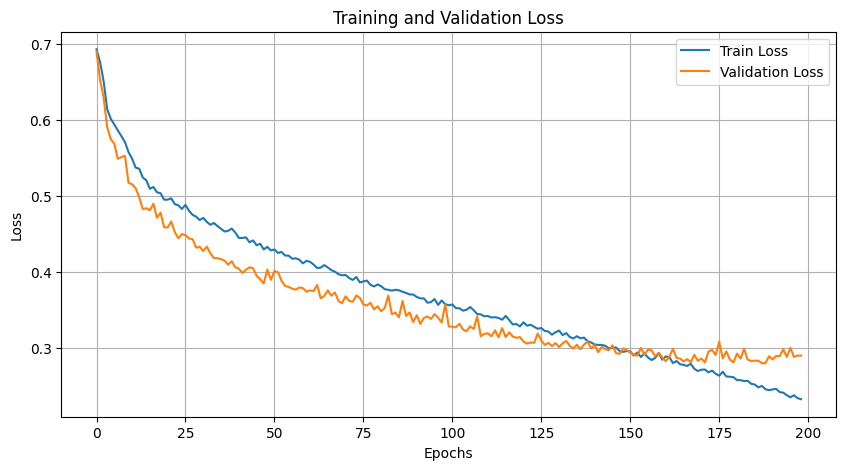

In [106]:
plot_training(epoch_train_errors_att, epoch_val_errors_att)

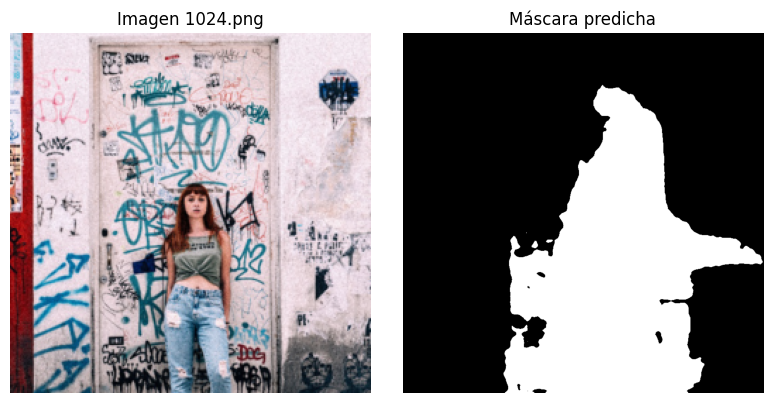

In [107]:
visualizar_test(unet_att, kaggle_loader_att, DEVICE)

In [108]:
_, _, _, kaggle_loader_att = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=base_img_tf,
                                                            train_transform_mask=base_mask_tf,
                                                            val_transform_img=base_img_tf,
                                                            val_transform_mask=val_transform_mask_rgb,
                                                            joint_transform_train=joint_train_aug,
                                                            joint_transform_val=joint_val_aug)

predict_and_build_submission(unet_att, DEVICE, kaggle_loader_att, out_csv="unet_rgb_att_submission")

submission guardado como: submissions/unet_rgb_att_submission_18-11-2025_16:19.csv


(           id                                     encoded_pixels
 0    1024.png  178358 1 179155 7 179954 10 180711 5 180752 14...
 1    1025.png  697 104 1497 104 2296 105 3096 105 3895 106 46...
 2    1027.png  179920 20 180715 30 181510 47 182307 57 183104...
 3    1037.png  21058 4 21858 5 22658 5 23458 5 24258 5 25058 ...
 4    1038.png  9511 1 10309 4 11108 6 11907 8 12707 9 13506 1...
 ..        ...                                                ...
 529   971.png  8799 2 9599 2 10398 3 11196 5 11995 6 12794 7 ...
 530   975.png  597 21 1397 21 2196 23 2996 23 3795 25 4594 26...
 531   987.png  313 62 468 49 522 58 582 7 621 25 647 28 1113 ...
 532   995.png  51560 2 51608 4 52358 5 52406 7 53157 8 53204 ...
 533   999.png  207101 12 207885 32 208681 41 209475 52 210270...
 
 [534 rows x 2 columns],
 'submissions/unet_rgb_att_submission_18-11-2025_16:19.csv')

### Pruebas luego del entrenamiento

Para ver si mejora:

1: probamos barrido de threshold porque estamos usando 0.5 para decidir si hay persona o no y tal vez no sea el mejor valor.

In [112]:
import torch
import torch.nn.functional as F
import numpy as np

def collect_probs_and_targets(model, val_loader, device):
    """
    Recorre el loader de validación y devuelve:
    - probs: tensor (N,1,H,W) con probabilidades sigmoide
    - targets: tensor (N,1,H,W) con máscaras 0/1
    """
    model.eval()
    all_probs = []
    all_targets = []

    with torch.no_grad():
        for x, y in val_loader:
            x = x.to(device)
            y = y.to(device).float()  # nos aseguramos float para operaciones

            # forward
            logits = model(x)  # (B,1,h',w')

            # redimensionar si fuera necesario
            if logits.shape[-2:] != y.shape[-2:]:
                logits = F.interpolate(
                    logits,
                    size=y.shape[-2:],
                    mode="bilinear",
                    align_corners=False,
                )

            probs = torch.sigmoid(logits)  # (B,1,H,W)

            # aseguramos que target tenga canal
            if y.ndim == 3:
                y = y.unsqueeze(1)

            all_probs.append(probs.cpu())
            all_targets.append(y.cpu())

    all_probs = torch.cat(all_probs, dim=0)
    all_targets = torch.cat(all_targets, dim=0)
    return all_probs, all_targets


def dice_from_probs(probs, targets, threshold):
    """
    Calcula Dice global sobre todo el set de validación
    para un threshold dado.
    probs, targets: (N,1,H,W)
    """
    # binarizar
    preds = (probs > threshold).float()

    # aplanar
    preds_f = preds.view(-1)
    targets_f = targets.view(-1)

    inter = (preds_f * targets_f).sum()
    union = preds_f.sum() + targets_f.sum()

    dice = (2.0 * inter + 1e-7) / (union + 1e-7)
    return dice.item()


In [113]:
# 1) juntar todas las probs y máscaras de validación una sola vez
probs_val, targets_val = collect_probs_and_targets(
    unet_att,          # tu modelo Attention U-Net
    val_loader_dice_att,
    DEVICE,
)

# 2) barrer thresholds y medir Dice
thresholds = np.linspace(0.2, 0.8, 13)  # 0.20, 0.25, ..., 0.80
best_t = None
best_dice = -1.0

for t in thresholds:
    d = dice_from_probs(probs_val, targets_val, t)
    print(f"threshold = {t:.2f} -> Dice val = {d:.4f}")
    if d > best_dice:
        best_dice = d
        best_t = t

print("\nMejor threshold en validación:")
print(f"t* = {best_t:.3f}, Dice_val = {best_dice:.4f}")


threshold = 0.20 -> Dice val = 0.8334
threshold = 0.25 -> Dice val = 0.8378
threshold = 0.30 -> Dice val = 0.8406
threshold = 0.35 -> Dice val = 0.8426
threshold = 0.40 -> Dice val = 0.8439
threshold = 0.45 -> Dice val = 0.8452
threshold = 0.50 -> Dice val = 0.8462
threshold = 0.55 -> Dice val = 0.8467
threshold = 0.60 -> Dice val = 0.8468
threshold = 0.65 -> Dice val = 0.8464
threshold = 0.70 -> Dice val = 0.8453
threshold = 0.75 -> Dice val = 0.8431
threshold = 0.80 -> Dice val = 0.8392

Mejor threshold en validación:
t* = 0.600, Dice_val = 0.8468


Accuracy: 0.8785
Dice: 0.8184


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona       0.92         0.87          0.9       8531764.0              
persona          0.82         0.88         0.85       5492940.0              
accuracy                                   0.88                              
macro avg        0.87         0.88         0.87      14024704.0      0.82    
weighted avg     0.88         0.88         0.88      14024704.0      0.82    
1                                                                    0.82    



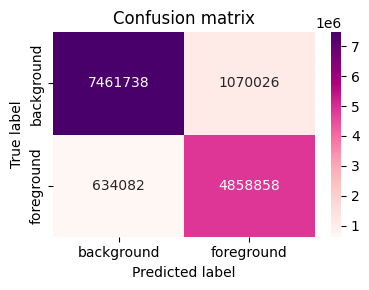

In [115]:
acc, rep, cm = model_segmentation_report(
    unet_att, test_loader_dice_tatt, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True, threshold=0.6
)

Con esta prueba confirmamos que el threshold de 0.5 no estaba mal, pero continuaremos a partir de acá con threshold 0.6.

2: Probamos postprocesado de mascaras, para verificar que el probema no sea que esten quedando con ruido o huecos sin rellenar.

In [116]:
import numpy as np
from scipy.ndimage import binary_opening, binary_closing, label

def clean_mask(mask_np, min_size=50):
    """
    mask_np: array (H, W) binario {0,1}
    min_size: tamaño mínimo de componente para mantener
    """
    m = mask_np.astype(bool)

    # Opening/closing morfológico
    m = binary_opening(m, structure=np.ones((3, 3)))
    m = binary_closing(m, structure=np.ones((3, 3)))

    # Eliminar componentes muy pequeñas
    labeled, num = label(m)
    for comp in range(1, num + 1):
        if np.sum(labeled == comp) < min_size:
            m[labeled == comp] = False

    return m.astype(np.uint8)


In [119]:
def dice_on_val_with_postproc(model, val_loader, device, threshold=0.5, min_size=50):
    model.eval()
    inter = 0.0
    union = 0.0

    with torch.no_grad():
        for x, y in val_loader:
            x = x.to(device)
            y = y.to(device).float()
            if y.ndim == 3:
                y = y.unsqueeze(1)

            logits = model(x)
            if logits.shape[-2:] != y.shape[-2:]:
                logits = F.interpolate(
                    logits,
                    size=y.shape[-2:],
                    mode="bilinear",
                    align_corners=False,
                )

            probs = torch.sigmoid(logits)
            preds = (probs > threshold).float()

            # convertir a numpy para postproceso por imagen
            preds_np = preds.cpu().numpy()
            y_np = y.cpu().numpy()

            # aplicar postproceso por batch
            clean_preds = []
            for i in range(preds_np.shape[0]):
                mask_i = preds_np[i, 0]  # (H,W)
                mask_clean = clean_mask(mask_i, min_size=min_size)
                clean_preds.append(mask_clean[None, ...])  # (1,H,W)

            clean_preds = np.stack(clean_preds, axis=0)   # (B,1,H,W)
            clean_preds = torch.from_numpy(clean_preds).float().to(device)

            inter += (clean_preds * y).sum().item()
            union += (clean_preds.sum() + y.sum()).item()

    dice = (2 * inter + 1e-7) / (union + 1e-7)
    return dice

dice_post = dice_on_val_with_postproc(unet_att, val_loader_dice_att, DEVICE, threshold=0.6, min_size=50)
print("Dice val con postprocesado:", dice_post)


Dice val con postprocesado: 0.8451093635614837


### Re entrenamos con Loss ponderada y mayor learning rate porque andaba lento

In [135]:
joint_train_aug = JointSegAugment(do_flip=True, do_rotate=True, max_angle=10)
joint_val_aug   = None
train_loader_att_2, val_loader_dice_att_2, test_loader_dice_att_2, kaggle_loader_att_2 = get_seg_dataloaders("data/train",
                                                            batch_size=BATCH_SIZE,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=base_img_tf,
                                                            train_transform_mask=base_mask_tf,
                                                            val_transform_img=base_img_tf,
                                                            val_transform_mask=val_transform_mask_rgb,
                                                            joint_transform_train=joint_train_aug,
                                                            joint_transform_val=joint_val_aug)

In [136]:
unet_att_2 = UNetAttention(
    n_class=1,
    n_channels=3,    
    padding=1,
    use_bn=False,    
    dropout=0.3,
    use_attention=True
).to(DEVICE) # es igual a la unet_att
criterion_att_2 = combined_loss
optimizer_att_2 = torch.optim.Adam(unet_att_2.parameters(), lr=3e-5) # 
 
epoch_train_errors_att, epoch_val_errors_att = train(unet_att_2, optimizer_att_2, criterion_att_2,
                                                 train_loader_att_2, val_loader_dice_att_2, DEVICE,
                                                 do_early_stopping=True, patience=10, epochs=200, log_every=5,
                                                 checkpoint_path="models/att_2.pth", loss_ponderada=True)

Epoch: 002 | Train Loss: 0.55113 | Val Loss: 0.50139
Epoch: 005 | Train Loss: 0.45939 | Val Loss: 0.43889
Epoch: 010 | Train Loss: 0.41991 | Val Loss: 0.38713
Epoch: 015 | Train Loss: 0.39674 | Val Loss: 0.36744
Epoch: 020 | Train Loss: 0.37459 | Val Loss: 0.33363
Epoch: 025 | Train Loss: 0.34812 | Val Loss: 0.31679
Epoch: 030 | Train Loss: 0.32996 | Val Loss: 0.31672
Epoch: 035 | Train Loss: 0.32008 | Val Loss: 0.29525
Epoch: 040 | Train Loss: 0.30124 | Val Loss: 0.28682
Epoch: 045 | Train Loss: 0.29079 | Val Loss: 0.27164
Epoch: 050 | Train Loss: 0.27086 | Val Loss: 0.26614
Epoch: 055 | Train Loss: 0.25912 | Val Loss: 0.26588
Epoch: 060 | Train Loss: 0.24445 | Val Loss: 0.25680
Epoch: 065 | Train Loss: 0.22993 | Val Loss: 0.25681
Epoch: 070 | Train Loss: 0.21043 | Val Loss: 0.25655
Epoch: 075 | Train Loss: 0.19407 | Val Loss: 0.26794
Detener entrenamiento en la época 75, la mejor pérdida fue 0.25384


Accuracy: 0.8753
Dice: 0.8132


Reporte de clasificación:

              precision      recall      f1-score     support        dice    
no-persona        0.9          0.9          0.9       8531764.0              
persona          0.84         0.84         0.84       5492940.0              
accuracy                                   0.88                              
macro avg        0.87         0.87         0.87      14024704.0      0.81    
weighted avg     0.88         0.88         0.88      14024704.0      0.81    
1                                                                    0.81    



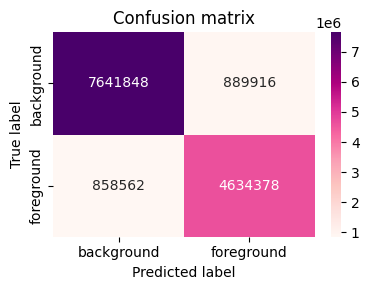

In [137]:
acc, rep, cm = model_segmentation_report(
    unet_att_2, test_loader_dice_att_2, DEVICE, NUM_CLASES,
    do_confusion_matrix=True, show_dice_loss=True
)

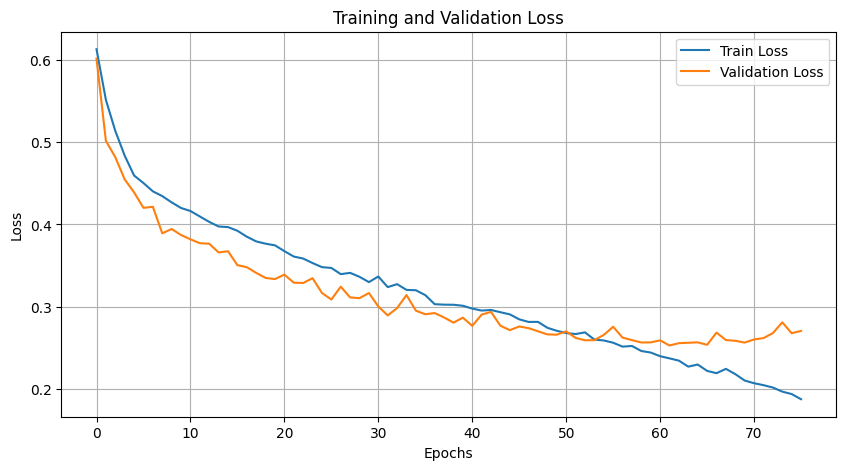

In [138]:
plot_training(epoch_train_errors_att, epoch_val_errors_att)

In [139]:
_, _, _, kaggle_loader_att_2 = get_seg_dataloaders("data/train",
                                                            batch_size=1,
                                                            num_workers=NUM_WORKERS,
                                                            seed=SEED,
                                                            rgb=True,
                                                            train_transform_img=base_img_tf,
                                                            train_transform_mask=base_mask_tf,
                                                            val_transform_img=base_img_tf,
                                                            val_transform_mask=val_transform_mask_rgb,
                                                            joint_transform_train=joint_train_aug,
                                                            joint_transform_val=joint_val_aug)

predict_and_build_submission(unet_att_2, DEVICE, kaggle_loader_att_2, out_csv="unet_rgb_att_2_submission")

submission guardado como: submissions/unet_rgb_att_2_submission_18-11-2025_19:25.csv


(           id                                     encoded_pixels
 0    1024.png  195999 2 196770 6 196797 4 197572 3 197597 4 1...
 1    1025.png  649 30 699 102 1449 30 1499 102 1836 6 2247 33...
 2    1027.png  183921 11 184712 30 185505 56 186300 69 187096...
 3    1037.png  145529 10 146324 29 147119 38 147875 7 147904 ...
 4    1038.png  702 13 1502 13 2302 14 3101 15 3901 16 4700 17...
 ..        ...                                                ...
 529   971.png  59955 2 60752 7 61549 12 62348 14 63146 16 639...
 530   975.png  589 38 1389 38 2188 40 2987 42 3787 43 4586 44...
 531   987.png  488 13 1288 13 2085 17 2883 20 3682 22 4482 22...
 532   995.png  349 16 1149 16 1948 17 2747 19 3546 20 3608 4 ...
 533   999.png  211082 19 211879 27 212677 33 213475 37 214272...
 
 [534 rows x 2 columns],
 'submissions/unet_rgb_att_2_submission_18-11-2025_19:25.csv')

In [145]:
predict_and_build_submission(unet_att_2, DEVICE, kaggle_loader_att_2, out_csv="unet_rgb_att_2_submission", threshold=0.6)

submission guardado como: submissions/unet_rgb_att_2_submission_18-11-2025_23:34.csv


(           id                                     encoded_pixels
 0    1024.png  209549 6 209566 6 210347 28 211145 30 211944 3...
 1    1025.png  703 98 1503 98 2301 100 3064 9 3100 101 3860 1...
 2    1027.png  184722 6 185510 33 186303 59 187100 68 187895 ...
 3    1037.png  147126 13 147920 32 148706 51 149475 7 149500 ...
 4    1038.png  2305 7 3104 9 3903 11 4703 11 5502 12 6302 12 ...
 ..        ...                                                ...
 529   971.png  67147 13 67911 4 67939 24 68709 8 68735 29 695...
 530   975.png  593 30 1393 30 2191 34 2990 36 3789 38 4588 39...
 531   987.png  3690 10 4488 12 5287 14 6085 17 6884 18 7683 2...
 532   995.png  357 3 1157 3 1953 9 2752 11 3550 14 4349 15 51...
 533   999.png  211884 16 212681 22 213479 28 214276 35 215074...
 
 [534 rows x 2 columns],
 'submissions/unet_rgb_att_2_submission_18-11-2025_23:34.csv')